# DM-18687: Investigate varying photometric zeropoints in HiTS processing

On DM-17536, I established that correlated variation in lightcurves from AP was related to the photometric calibration of “steady” sources in single frame processing varying from visit to visit. This ticket is to figure out what's going on!

In [1]:
import os
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
import lsst.geom
from lsst.pipe.base import Struct
afwDisplay.setDefaultBackend('matplotlib')
import matplotlib.ticker as plticker
from astropy.visualization import (ZScaleInterval, SqrtStretch, ImageNormalize)
from lsst.daf.base import DateTime
import lsst.meas.algorithms as measAlg
import lsst.meas.astrom as measAstrom
import astropy.units as u
import astropy.coordinates as coord

## Load the repo with a recent ap_pipe rerun and corresponding coadd templates

Using a recent rerun of ap_pipe with CompareWarp templates from Jan 2019. The ``repo`` and ``repoOld`` are a reruns with and without a magnitude cut on the reference catalog sources, which is justified below.

In [2]:
repoOld = '/project/mrawls/hits2015/rerun/cw_processed3'  # no refcat photometric constraints
repo = '/project/mrawls/hits2015/rerun/cw_processed4'  # magnitude cut on refcat photometry sources
butlerOld = dafPersist.Butler(repoOld)
butler = dafPersist.Butler(repo)

In [3]:
templateRepo = '/project/mrawls/hits2014/coadds_processed2'  # the same CompareWarp templates we've used for a while
templateButler = dafPersist.Butler(templateRepo)

The following functions are adapted from diaObjectAnalysis.py and plotLightcurve.py for ease of use here

In [4]:
def loadAllPpdbObjects(repo, dbName='association.db'):
    """Load select DIAObject columns from a PPDB into a pandas dataframe.

    Parameters
    ----------
    repo : `str`
        Path to an output repository from an ap_pipe run.
    dbName : `str`, optional
        Name of the PPDB, which must reside in (or relative to) repo.

    Returns
    -------
    objTable : `pandas.DataFrame`
        DIA Object Table containing only objects with validityEnd NULL.
        Columns selected are presently hard-wired here.
    """
    connection = sqlite3.connect(os.path.join(repo, dbName))

    # These are the tables available in the ppdb
    tables = {'obj': 'DiaObject', 'src': 'DiaSource', 'ccd': 'CcdVisit'}

    # Only get objects with validityEnd NULL because that means they are still valid
    objTable = pd.read_sql_query('select diaObjectId, ra, decl, nDiaSources, \
                                  gPSFluxMean, validityEnd, flags from {0} \
                                  where validityEnd is NULL;'.format(tables['obj']), connection)
    return objTable

In [5]:
def loadSources(repo, objId, sqliteFile='association.db'):
    connection = sqlite3.connect(os.path.join(repo, sqliteFile))
    tables = {'obj': 'DiaObject', 'src': 'DiaSource', 'ccd': 'CcdVisit'}

    # only choose objects with validityEnd NULL because that means they are still valid
    srcTable = pd.read_sql_query('select diaSourceId, diaObjectId, ccdVisitId, midPointTai, apFlux, psFlux, apFluxErr, psFluxErr, totFlux, totFluxErr, flags from {1} where diaObjectId = {0};'.format(objId, tables['src']), connection)

    connection.close()
    return srcTable

In [6]:
def patchFinder(obj, objTable, templateRepo, patchList):
    """Determine which patch overlaps a DIA Object RA, Dec location
    from a list of possible patches.

    Parameters
    ----------
    obj : `int`
        DIA Object ID.
    objTable : `pandas.DataFrame`
        DIA Object Table which contains obj.
    templateRepo : `str`
        Path to repository containing templates for image differencing.
    patchList : `list`
        List of possible patches.

    Returns
    -------
    templatePatch : `str`
        The first patch in patchList which overlaps the RA, Dec of obj.
    """
    templateButler = dafPersist.Butler(templateRepo)
    templatePatch = None
    for patch in patchList:
        ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
        dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
        centerSource = lsst.geom.SpherePoint(ra, dec, lsst.geom.degrees)
        size = lsst.geom.Extent2I(30, 30)
        templateDataId = {'filter': 'g', 'tract': 0, 'patch': patch}
        templateImage = templateButler.get('deepCoadd', dataId=templateDataId)
        try:
            templateImage.getCutout(centerSource, size)
        except:
            pass
        else:
            templatePatch = patch
            return templatePatch
            break
    if templatePatch is None:
        print('WARNING: No template patch found')

In [7]:
def plotLightcurve(obj, objTable, repo, dbName, templateRepo, patchList,
                   useTotFlux=False, plotAllCutouts=False,
                   cutoutIdx=0, labelCutouts=False, diffimType='deepDiff_differenceExp'):
    """Plot lightcurve and processed, template, and difference image cutouts
    for one DIAObject. The lightcurve includes all associated DIASources.
    """
    print('Loading PPDB Sources...')
    dbPath = os.path.join(repo, dbName)
    srcTable = loadSources(repo, obj)
    ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
    dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
    #  flags = srcTable['flags']
    dataIds = srcTable['ccdVisitId'].values  # these are ints
    dataIdDicts = []
    for dataId in dataIds:
        visit = int(str(dataId)[0:6])
        ccdnum = int(str(dataId)[6:])
        dataIdDict = {'visit': visit, 'ccdnum': ccdnum}
        dataIdDicts.append(dataIdDict)
    centerSource = lsst.geom.SpherePoint(ra, dec, lsst.geom.degrees)
    size = lsst.geom.Extent2I(30, 30)
    patch = patchFinder(obj, objTable, templateRepo, patchList)

    print('DIAObject ID:', obj)
    # print('Flags:', flags)
    print('RA (rad):', ra.values*np.pi/180)
    print('Dec (rad):', dec.values*np.pi/180)
    print('Number of DIASources:', len(srcTable['diaSourceId'].values))
    # print('DIASource IDs:', srcTable['diaSourceId'].values)
    # print('Data IDs:', dataIdDicts)
    print('Template patch:', patch)

    fig1 = plt.figure()
    fig1.text(0.5, 0.5, str(obj), horizontalalignment='center', verticalalignment='center')

    # light curve with psFlux by default (uses totFlux if useTotFlux=True)
    plt.subplot(212)
    plt.xlabel('Time (MJD)', size=16)
    if not useTotFlux:
        plt.errorbar(srcTable['midPointTai'], srcTable['psFlux'], yerr=srcTable['psFluxErr'],
                     ls=':', marker='o', color='#2979C1')
        plt.ylabel('Difference Flux (nJy)', size=16)
    else:
        plt.errorbar(srcTable['midPointTai'], srcTable['totFlux'], yerr=srcTable['totFluxErr'],
                     ls=':', marker='o', color='#2979C1')
        plt.ylabel('Flux (nJy)', size=16)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    # processed image
    plt.subplot(231)
    plt.gca().get_xaxis().set_ticks([])
    plt.gca().get_yaxis().set_ticks([])
    plt.title('Processed', size=16)
    butler = dafPersist.Butler(repo)
    calexpFirst = butler.get('calexp', dataIdDicts[cutoutIdx])
    calexpArray = calexpFirst.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
    calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    plt.imshow(np.rot90(np.fliplr(calexpArray)), cmap='gray', norm=calexpNorm)

    # template image
    plt.subplot(232)
    plt.gca().get_xaxis().set_ticks([])
    plt.gca().get_yaxis().set_ticks([])
    plt.title('Template', size=16)
    if patch is not None:
        templateDataId = {'filter': 'g', 'tract': 0, 'patch': patch}
        butlerTemplate = dafPersist.Butler(templateRepo)
        template = butlerTemplate.get('deepCoadd', dataId=templateDataId)
        templateArray = template.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
        templateNorm = ImageNormalize(templateArray, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(np.flipud(templateArray), cmap='gray', norm=templateNorm)

    # difference image
    plt.subplot(233)
    plt.gca().get_xaxis().set_ticks([])
    plt.gca().get_yaxis().set_ticks([])
    plt.title('Difference', size=16)
    diffimFirst = butler.get(diffimType, dataIdDicts[cutoutIdx])
    diffimArray = diffimFirst.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
    diffimNorm = ImageNormalize(diffimArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    plt.imshow(np.rot90(np.fliplr(diffimArray)), cmap='gray', norm=diffimNorm)

    if plotAllCutouts:
        fig2 = plt.figure(figsize=(8, 8))  # optional figure with cutouts for all visits
        fig2.subplots_adjust(hspace=0, wspace=0)
        fig2.text(0.5, 0.9, str(obj), horizontalalignment='center', verticalalignment='top')
        for idx, dataId in enumerate(dataIdDicts):
            calexp = butler.get('calexp', dataId)
            calexpArray = calexp.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
            calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
            diffim = butler.get(diffimType, dataId)
            diffimArray = diffim.getCutout(centerSource, size).getMaskedImage().getImage().getArray()
            diffimNorm = ImageNormalize(diffimArray, interval=ZScaleInterval(), stretch=SqrtStretch())
            plt.subplot(12, 12, idx+1)
            plt.gca().get_xaxis().set_ticks([])
            plt.gca().get_yaxis().set_ticks([])
            plt.imshow(np.rot90(np.fliplr(calexpArray)), cmap='gray', norm=calexpNorm)
            if labelCutouts:
                if idx == 0:
                    plt.text(1, 26, 'Proc', color='lime', size=8)
                plt.text(2, 5, str(srcTable['midPointTai'][idx])[1:8], color='lime', size=8)
                # TODO: PRINT FLAG INFORMATION ON/NEAR CUTOUTS...?
            plt.subplot(12, 12, idx+72+1)
            plt.gca().get_xaxis().set_ticks([])
            plt.gca().get_yaxis().set_ticks([])
            plt.imshow(np.rot90(np.fliplr(diffimArray)), cmap='gray', norm=diffimNorm)
            if labelCutouts:
                if idx == 0:
                    plt.text(1, 26, 'Diff', color='lime', size=8)
                plt.text(2, 5, str(srcTable['midPointTai'][idx])[1:8], color='lime', size=8)

### Load the entire DIA Object table for the "old" (no refcat magnitude cuts) and "new" reruns

In [8]:
objTableOld = loadAllPpdbObjects(repoOld)
objTable = loadAllPpdbObjects(repo)

### Define a small subset of DIA Objects to work with

In [9]:
objSubsetOld = ((objTableOld['decl'] < -5.5) & (objTableOld['decl'] > -6.5) & 
                (objTableOld['ra'] < 155.32) & (objTableOld['ra'] > 154.63) &
                (objTableOld['gPSFluxMean'] > 0) & (objTableOld['gPSFluxMean'] < 0.0002e7) &
                (objTableOld['nDiaSources'] > 40))# & (objTableOld['flags'] == 0))
objSubset = ((objTable['decl'] < -5.5) & (objTable['decl'] > -6.5) & 
             (objTable['ra'] < 155.32) & (objTable['ra'] > 154.63) &
             (objTable['gPSFluxMean'] > 0) & (objTable['gPSFluxMean'] < 0.0002e7) &
             (objTable['nDiaSources'] > 40))# & (objTable['flags'] == 0))

In [10]:
print(len(objTableOld.loc[objSubsetOld, 'diaObjectId'].values))
print(len(objTable.loc[objSubset, 'diaObjectId'].values))

13
13


In [11]:
patchList = ['11,6', '12,6', '11,7', '12,7', '11,8', '12,8']

### Plot the sources on the sky to see if they're the same between "old" and "new" (spoiler: they are)

<IPython.core.display.Javascript object>


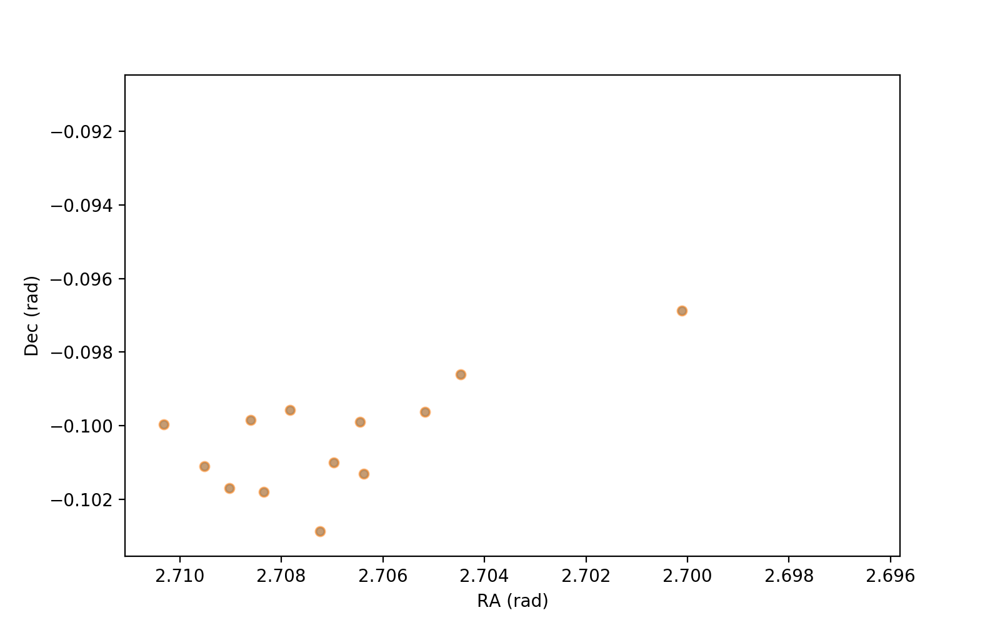

In [12]:
plt.figure(figsize=(8,5))
plt.xlabel('RA (rad)')
plt.ylabel('Dec (rad)')
plt.gca().invert_xaxis()
#plt.axes([-5.5*np.pi/180, -6.5*np.pi/180, 155.32*np.pi/180, 154.63*np.pi/180])
ccdVisitIdsOld = []
ccdVisitIds = []

for obj in objTableOld.loc[objSubsetOld, 'diaObjectId']:
    sources = loadSources(repoOld, obj)
    ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
    dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
    plt.scatter(ra.values*np.pi/180, dec.values*np.pi/180, color='C0', s=20, alpha=0.5)
    ccdVisitIdsOld.extend(sources['ccdVisitId'].values)

for obj in objTable.loc[objSubset, 'diaObjectId']:
    sources = loadSources(repo, obj)
    ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
    dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
    plt.scatter(ra.values*np.pi/180, dec.values*np.pi/180, color='C1', s=30, alpha=0.5)
    ccdVisitIds.extend(sources['ccdVisitId'].values)

In [13]:
ccdVisitIdsOld = list(set(ccdVisitIdsOld))
ccdVisitIds = list(set(ccdVisitIds))
print(len(ccdVisitIdsOld))
print(len(ccdVisitIds))

208
208


### Plot some light curves to illustrate the systematic trends problem we want to troubleshoot

<IPython.core.display.Javascript object>


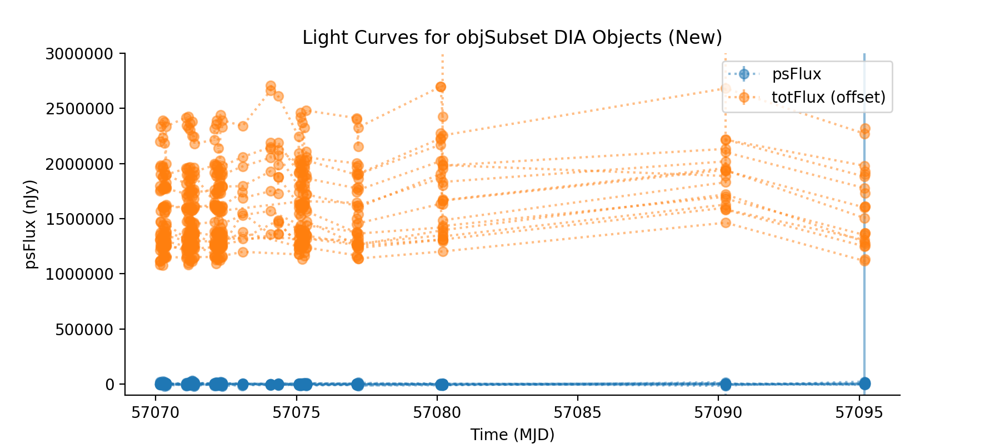

In [14]:
plt.figure(figsize=(9,4))
plt.title('Light Curves for objSubset DIA Objects (New)')
plt.gca().set_ylim(-1e5, 3e6)
goodDiaObjectIds = []
for idx, obj in enumerate(objTable.loc[objSubset, 'diaObjectId'].values):
    goodDiaObjectIds.append(obj)
    sources = loadSources(repo, obj)
    #ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
    #dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
    plt.errorbar(sources['midPointTai'], sources['psFlux'], yerr=sources['psFluxErr'], 
                 ls=':', marker='o', color='C0', alpha=0.5, label='psFlux')
    plt.errorbar(sources['midPointTai'], sources['totFlux'] + 1e6, yerr=sources['totFluxErr'], 
                 ls=':', marker='o', color='C1', alpha=0.5, label='totFlux (offset)')
    plt.xlabel('Time (MJD)')
    plt.ylabel('psFlux (nJy)')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if idx == 0:
        plt.legend(loc='upper right')

<IPython.core.display.Javascript object>


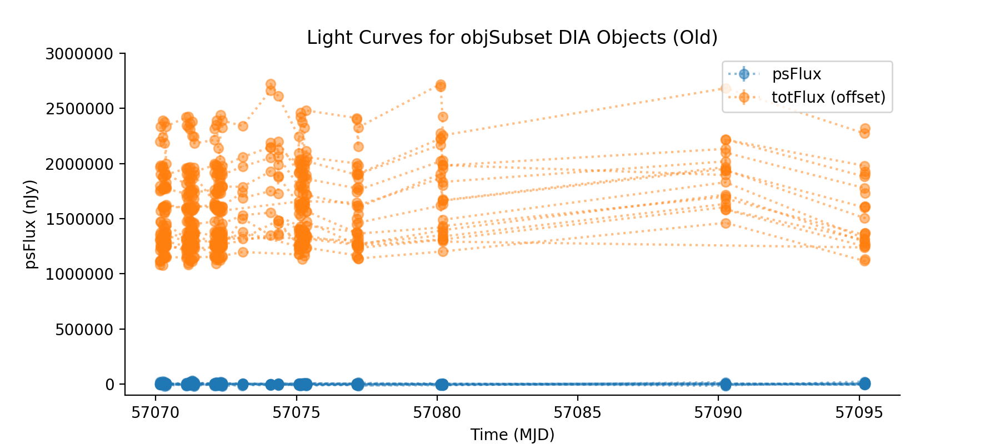

In [15]:
plt.figure(figsize=(9,4))
plt.title('Light Curves for objSubset DIA Objects (Old)')
plt.gca().set_ylim(-1e5, 3e6)
for idx, obj in enumerate(objTableOld.loc[objSubsetOld, 'diaObjectId'].values):
    sources = loadSources(repoOld, obj)
    #ra = objTable.loc[objTable['diaObjectId'] == obj, 'ra']
    #dec = objTable.loc[objTable['diaObjectId'] == obj, 'decl']
    plt.errorbar(sources['midPointTai'], sources['psFlux'], yerr=sources['psFluxErr'], 
                 ls=':', marker='o', color='C0', alpha=0.5, label='psFlux')
    plt.errorbar(sources['midPointTai'], sources['totFlux'] + 1e6, yerr=sources['totFluxErr'], 
                 ls=':', marker='o', color='C1', alpha=0.5, label='totFlux (offset)')
    plt.xlabel('Time (MJD)')
    plt.ylabel('psFlux (nJy)')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if idx == 0:
        plt.legend(loc='upper right')

## Look at photometric calibration values as a function of time

These plots illustrate why we thought photometric calibration might be the cause of the light curve systematic trends seen above. The overall trend looks similar/inverted by eye.

However, if adding a magnitude cut to the refcats (to improve the photometric calibration) fixed the problem, we would expect the photometric calibration factor vs. time plot to look different for "old" vs. "new." This is **not** the case.

<IPython.core.display.Javascript object>


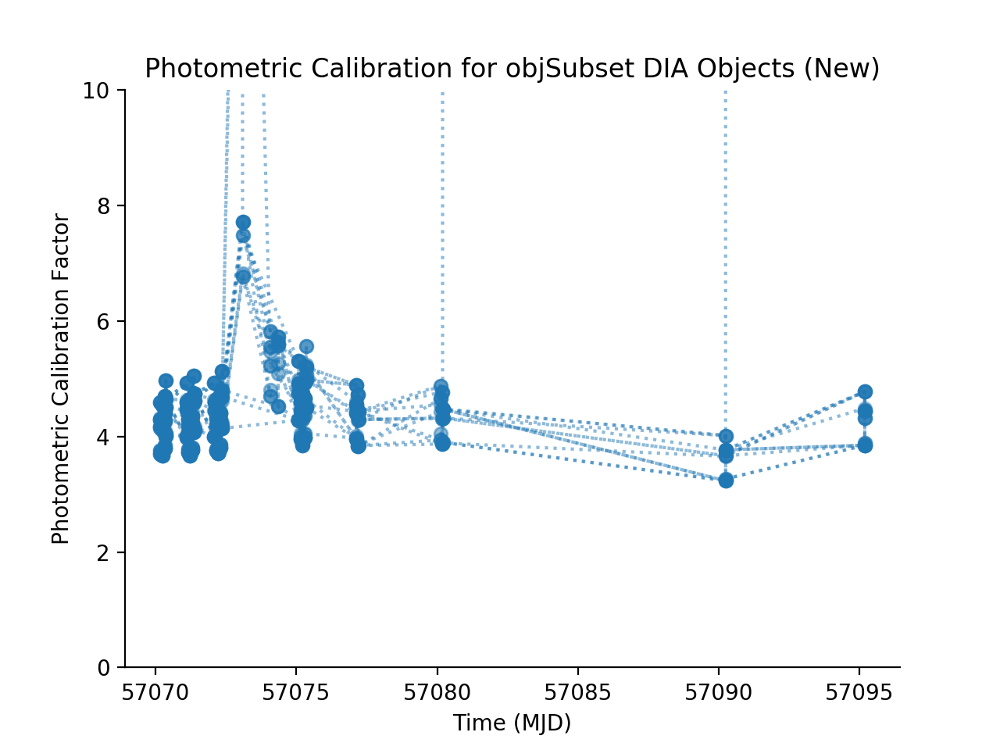

In [16]:
plt.figure()
plt.title('Photometric Calibration for objSubset DIA Objects (New)')
for obj in objTable.loc[objSubset, 'diaObjectId'].values:
    sources = loadSources(repo, obj)
    ccdVisitId = sources['ccdVisitId']
    timeList = []
    flux0List = []
    flux0ErrList = []
    for visit in ccdVisitId:
        visit = str(visit)
        dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
        visit_info = butler.get('calexp_visitInfo', dataId=dataId)
        time = visit_info.getDate().get(system=DateTime.MJD)
        photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
        flux0 = photoCalib.getCalibrationMean()
        flux0Err = photoCalib.getCalibrationErr()
        timeList.append(time)
        flux0List.append(flux0)
        flux0ErrList.append(flux0Err)
    plt.errorbar(timeList, flux0List, yerr=flux0ErrList, ls=':', marker='o', color='C0', alpha=0.5)
    plt.xlabel('Time (MJD)')
    plt.ylabel('Photometric Calibration Factor')
    plt.gca().set_ylim(0, 10)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

<IPython.core.display.Javascript object>


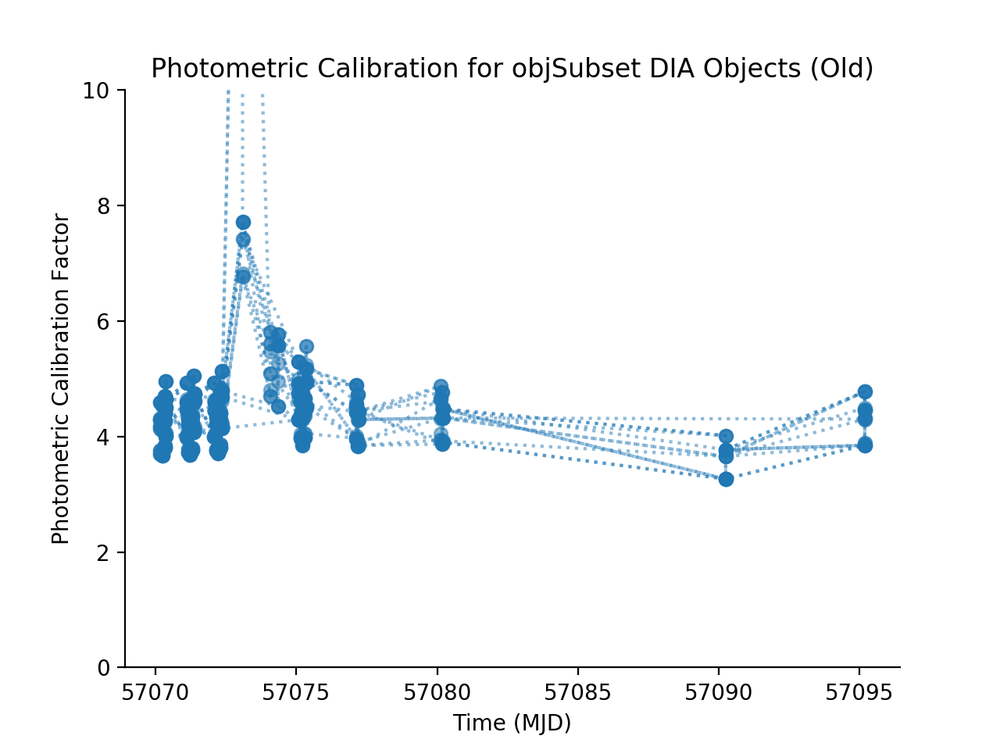

In [17]:
plt.figure()
plt.title('Photometric Calibration for objSubset DIA Objects (Old)')
for obj in objTableOld.loc[objSubsetOld, 'diaObjectId'].values:
    sources = loadSources(repoOld, obj)
    ccdVisitId = sources['ccdVisitId']
    timeList = []
    flux0List = []
    flux0ErrList = []
    for visit in ccdVisitId:
        visit = str(visit)
        dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
        visit_info = butlerOld.get('calexp_visitInfo', dataId=dataId)
        time = visit_info.getDate().get(system=DateTime.MJD)
        photoCalib = butlerOld.get('calexp_photoCalib', dataId=dataId)
        flux0 = photoCalib.getCalibrationMean()
        flux0Err = photoCalib.getCalibrationErr()
        timeList.append(time)
        flux0List.append(flux0)
        flux0ErrList.append(flux0Err)
    plt.errorbar(timeList, flux0List, yerr=flux0ErrList, ls=':', marker='o', color='C0', alpha=0.5)
    plt.xlabel('Time (MJD)')
    plt.ylabel('Photometric Calibration Factor')
    plt.gca().set_ylim(0, 10)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

## Welcome to "we have no idea what's going on, let's plot some cutouts" land

Loading PPDB Sources...
DIAObject ID: 176492665892766016
RA (rad): [2.70011456]
Dec (rad): [-0.09687245]
Number of DIASources: 41
Template patch: 12,8


<IPython.core.display.Javascript object>


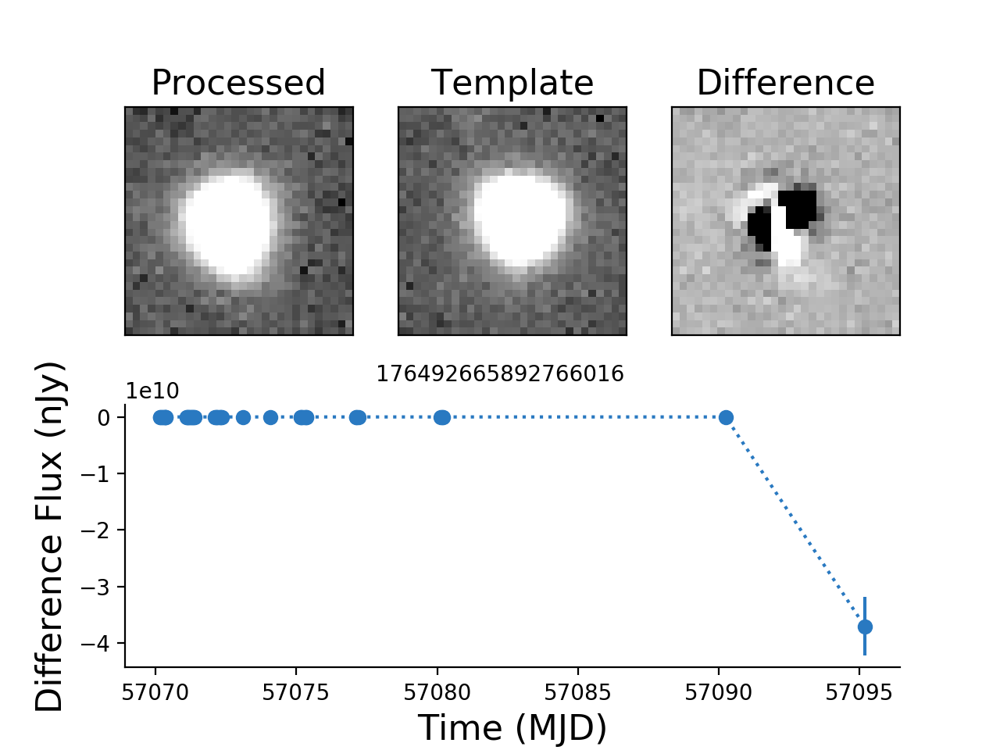

<IPython.core.display.Javascript object>


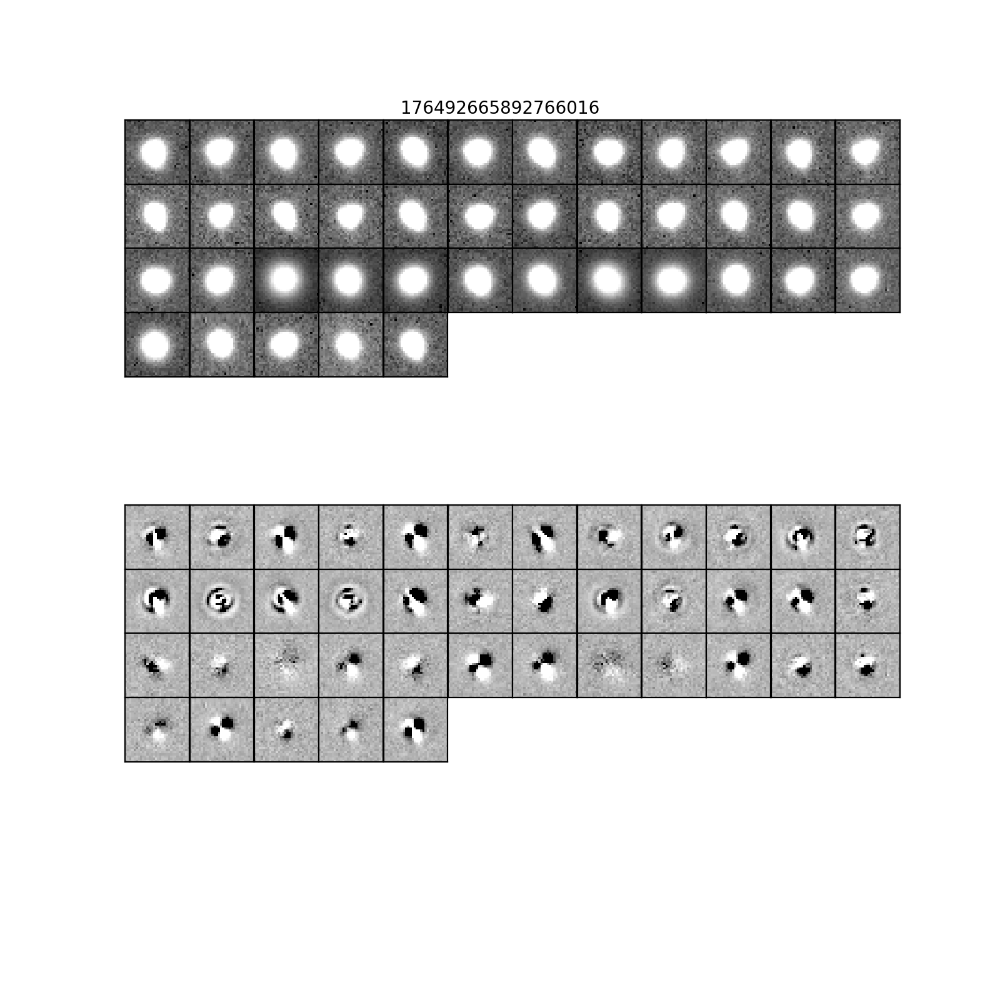

Loading PPDB Sources...
DIAObject ID: 176492665892766198
RA (rad): [2.70446477]
Dec (rad): [-0.09860521]
Number of DIASources: 48
Template patch: 12,8


<IPython.core.display.Javascript object>


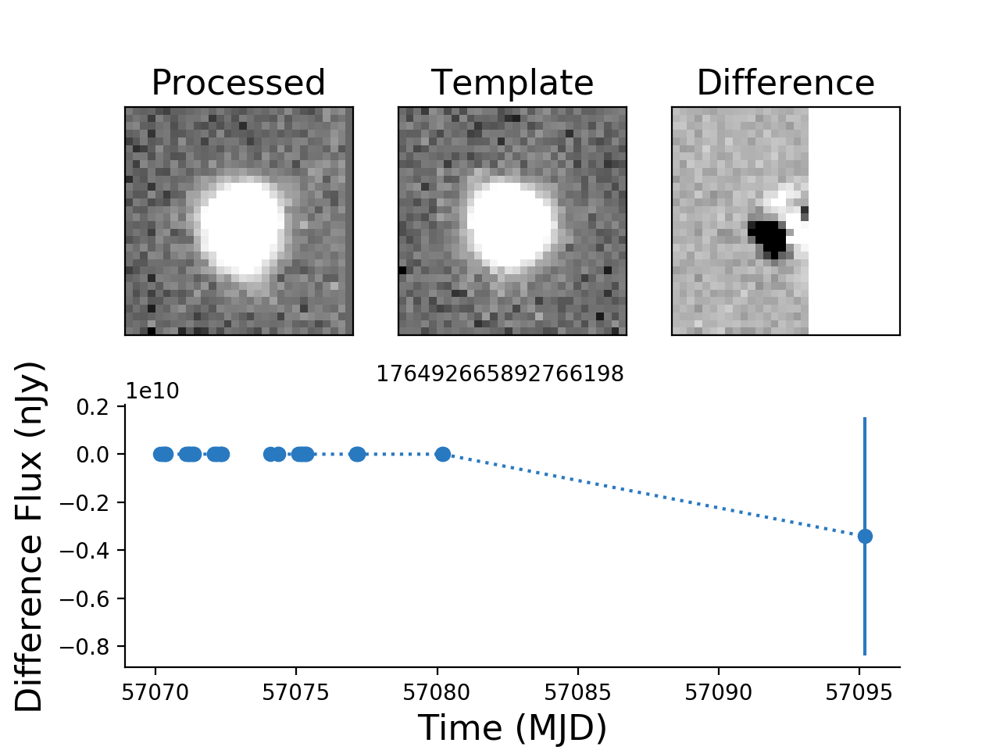

<IPython.core.display.Javascript object>


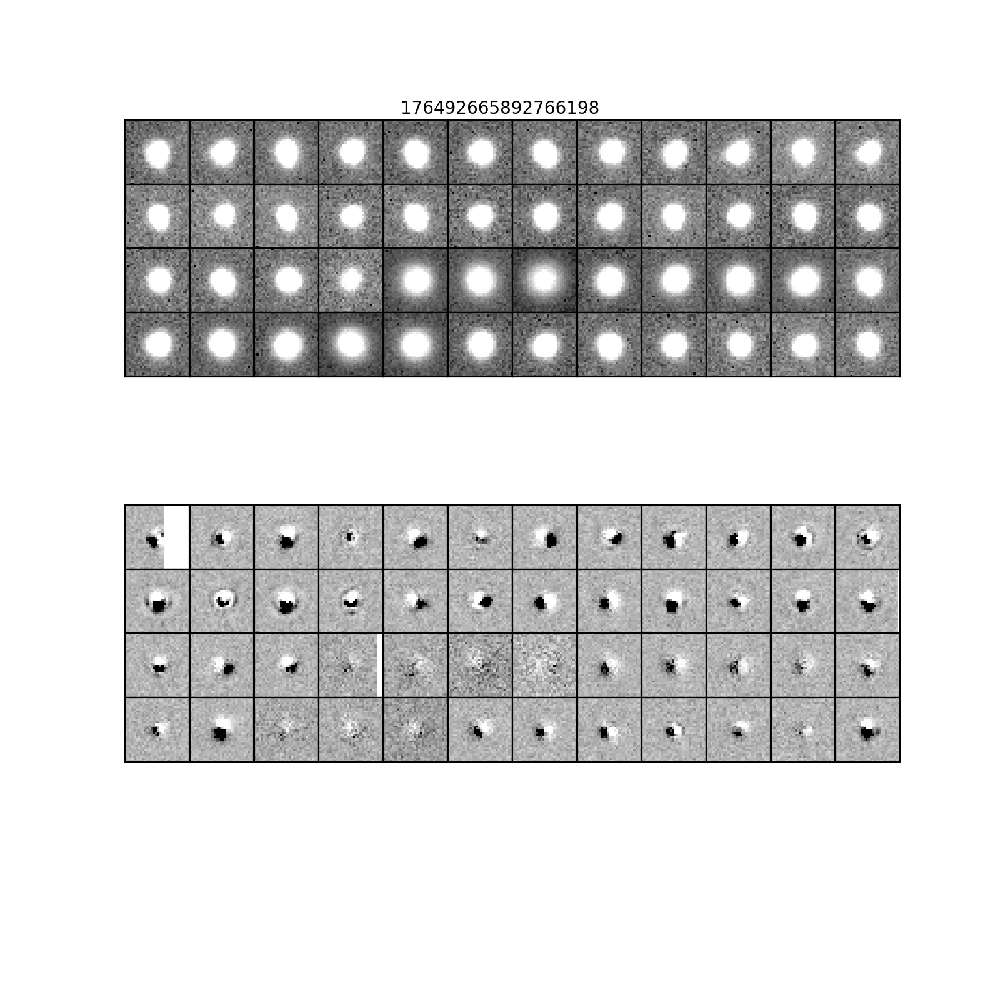

Loading PPDB Sources...
DIAObject ID: 176492687367602387
RA (rad): [2.70859871]
Dec (rad): [-0.09983905]
Number of DIASources: 43
Template patch: 11,8


<IPython.core.display.Javascript object>


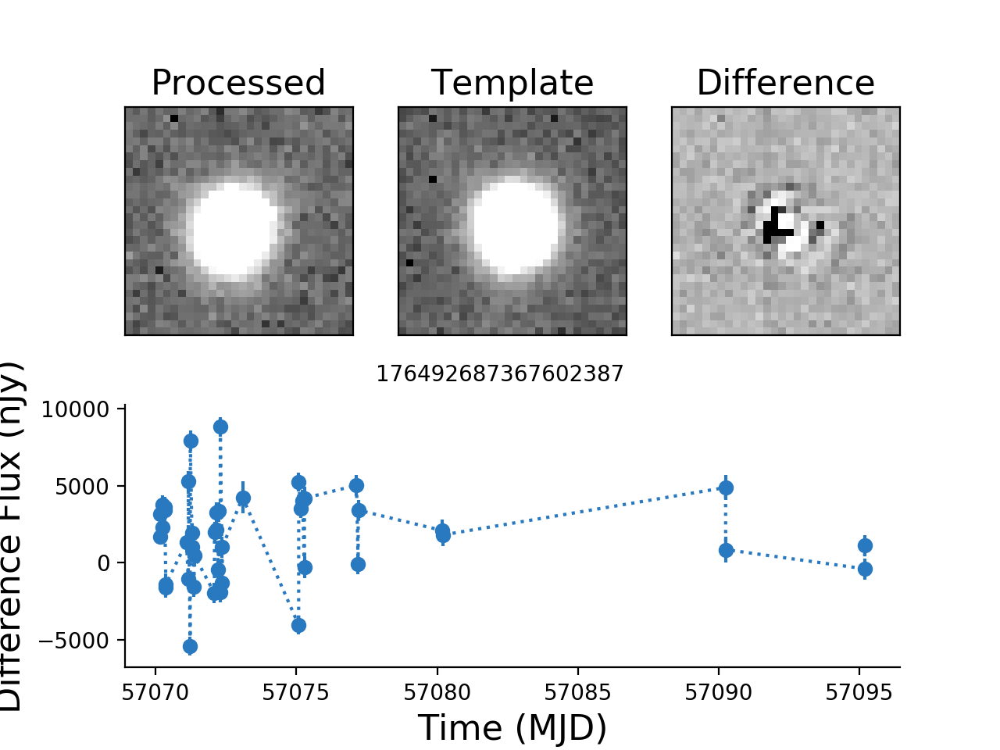

<IPython.core.display.Javascript object>


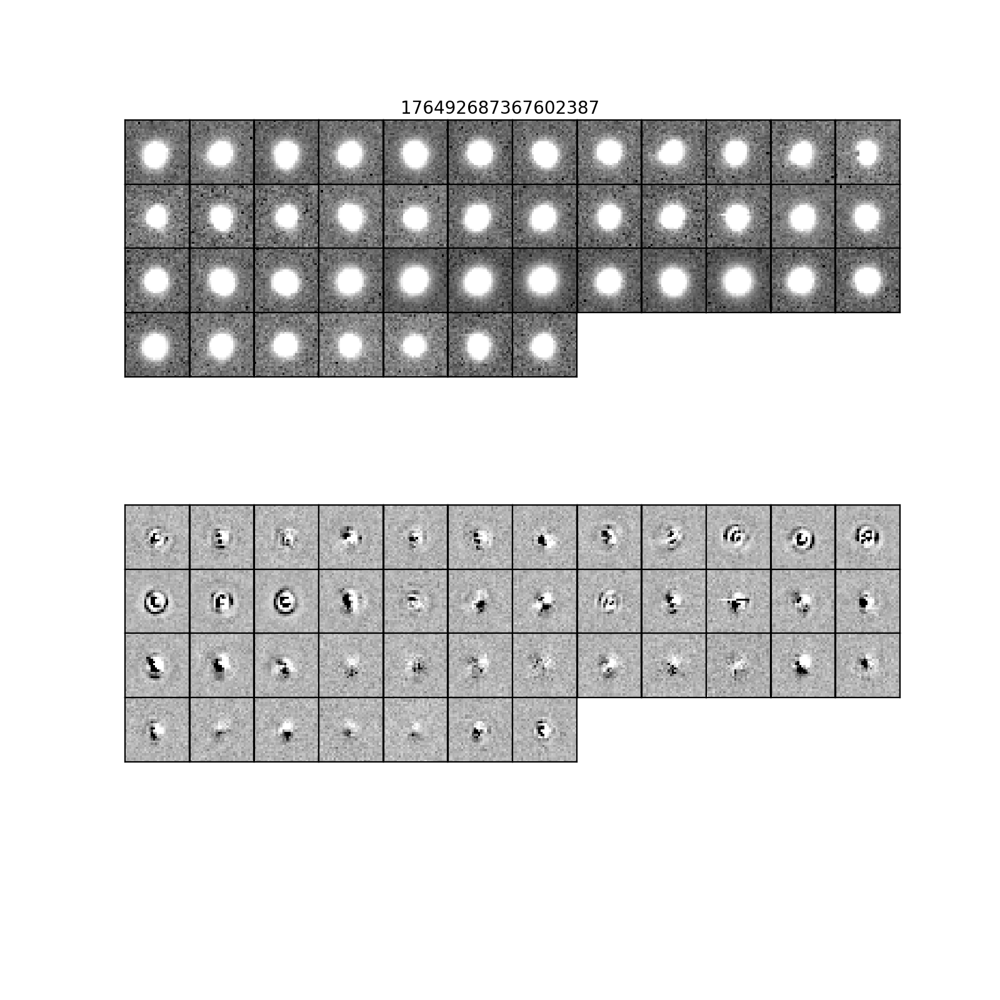

In [18]:
for obj in objTable.loc[objSubset, 'diaObjectId'].values[0:3]:
    plotLightcurve(obj, objTable, repo,
                   'association.db', templateRepo, patchList=patchList,
                   useTotFlux=False, plotAllCutouts=True)

### And the same DIA Object cutout + light curve plots for the "old" repo

They look almost identical, which confirms that improving the photometric calibration did not fix the problem.
They are not **exactly** identical, though, which confirms we didn't accidentally plot the same thing twice.

Loading PPDB Sources...
DIAObject ID: 176492665892766016
RA (rad): [2.70011456]
Dec (rad): [-0.09687245]
Number of DIASources: 41
Template patch: 12,8


<IPython.core.display.Javascript object>


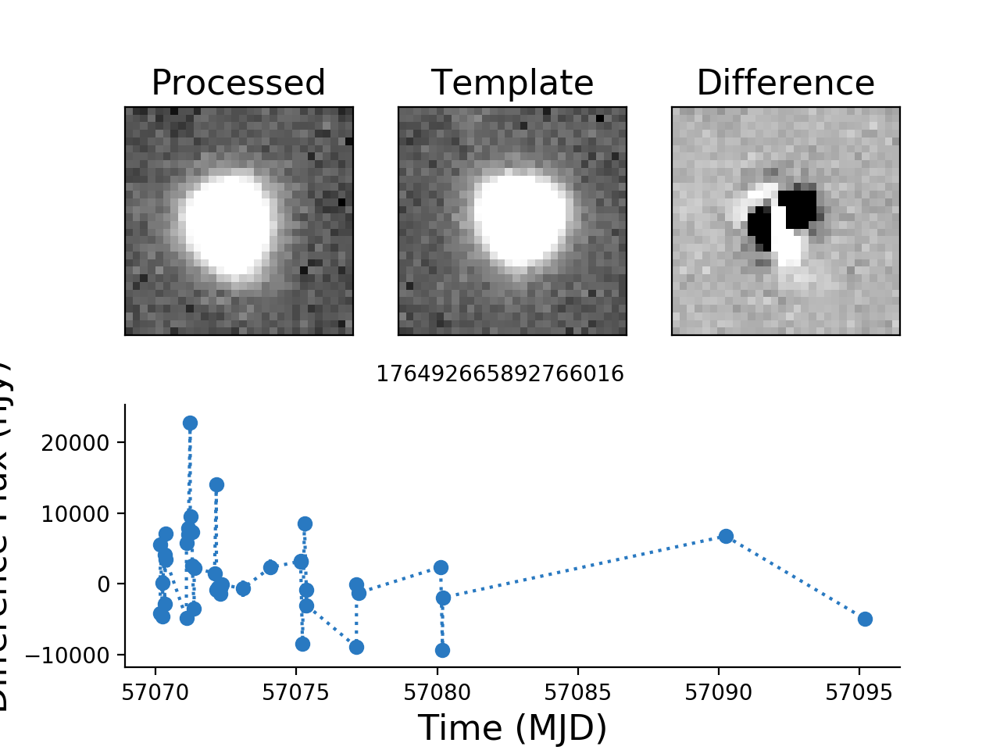

<IPython.core.display.Javascript object>


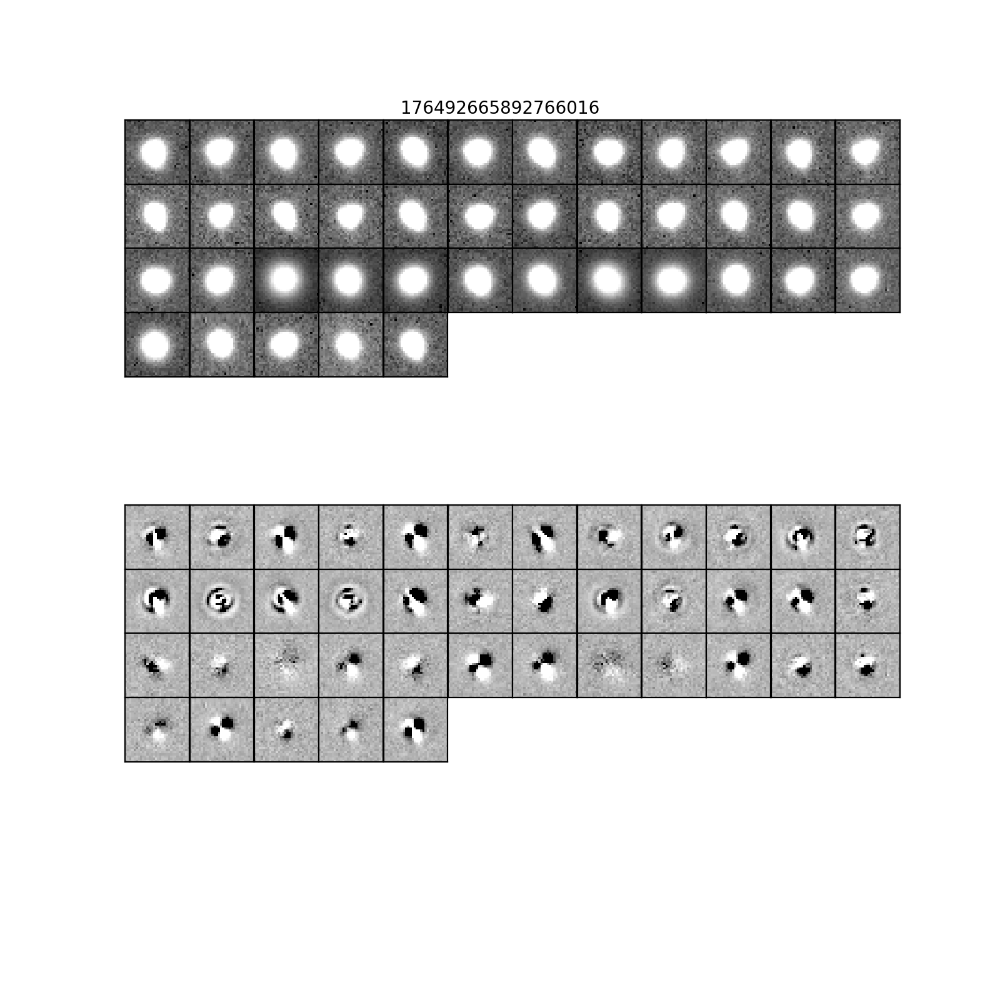

Loading PPDB Sources...
DIAObject ID: 176492665892766198
RA (rad): [2.70446477]
Dec (rad): [-0.09860521]
Number of DIASources: 48
Template patch: 12,8


<IPython.core.display.Javascript object>


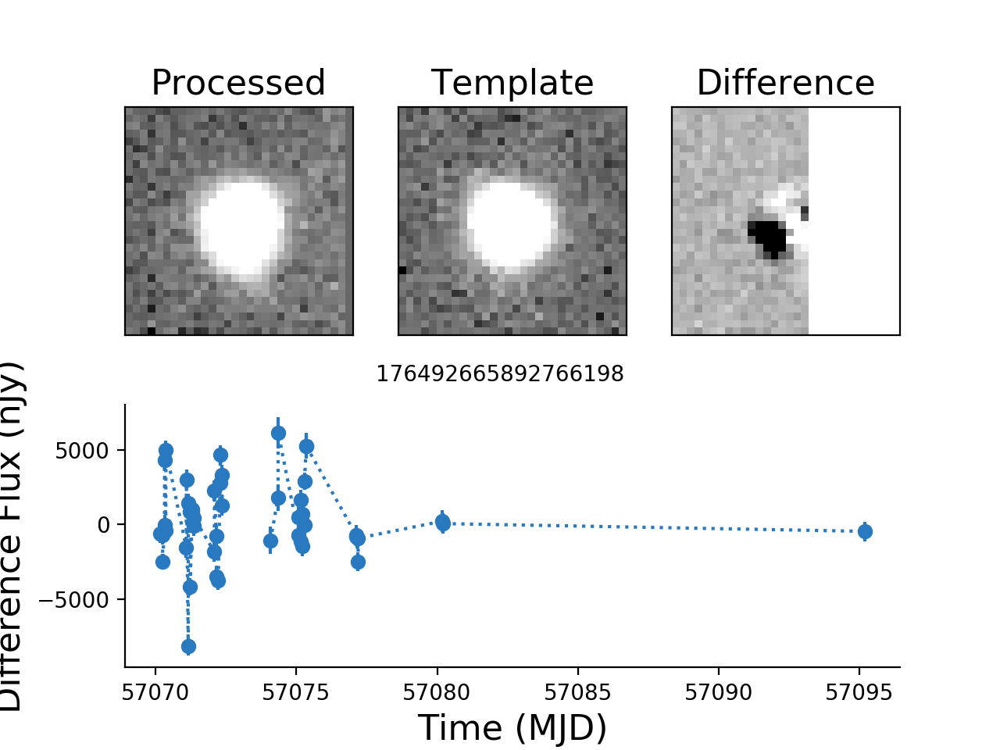

<IPython.core.display.Javascript object>


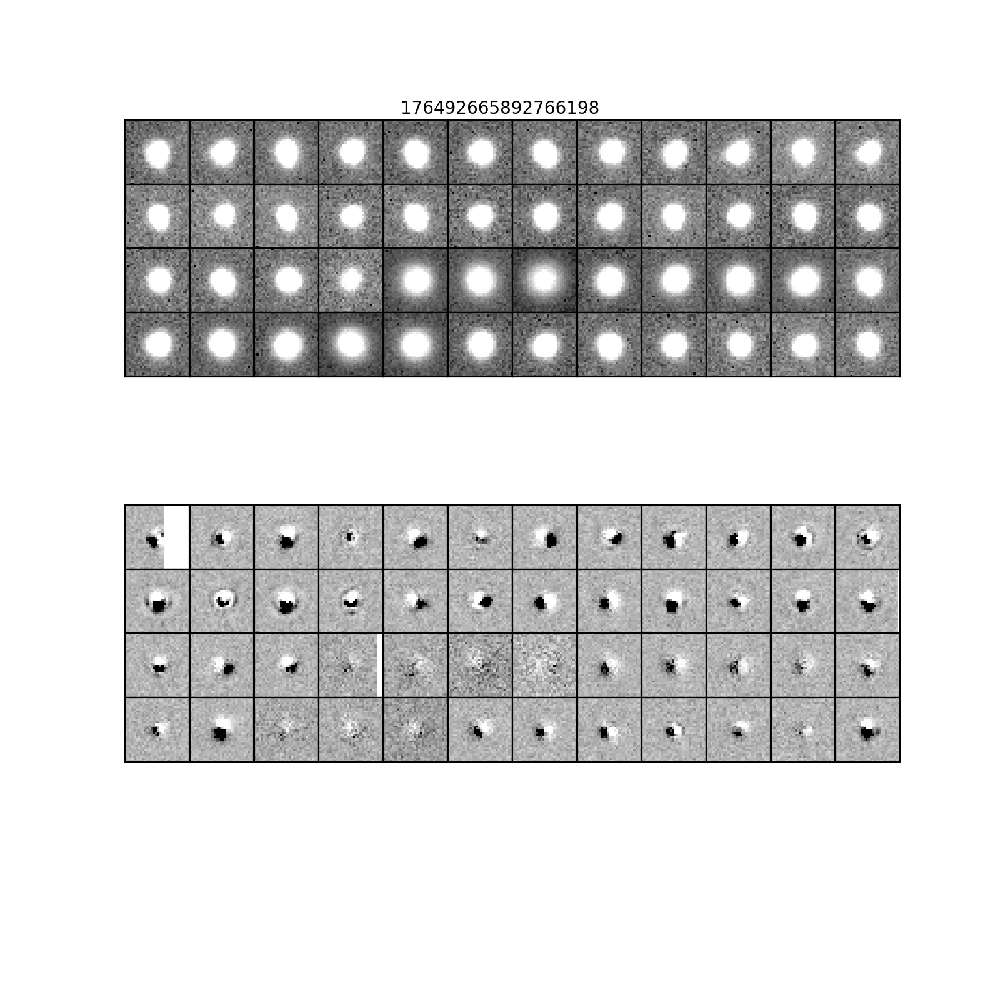

Loading PPDB Sources...
DIAObject ID: 176492683072635251
RA (rad): [2.70637344]
Dec (rad): [-0.10130349]
Number of DIASources: 49
Template patch: 11,7


<IPython.core.display.Javascript object>


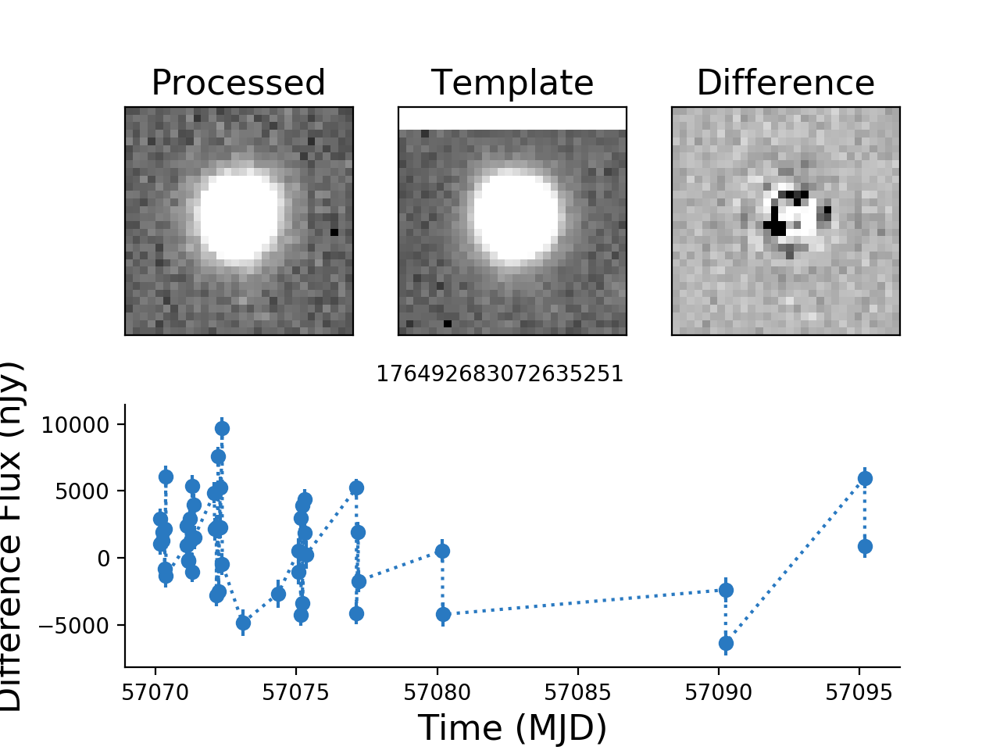

<IPython.core.display.Javascript object>


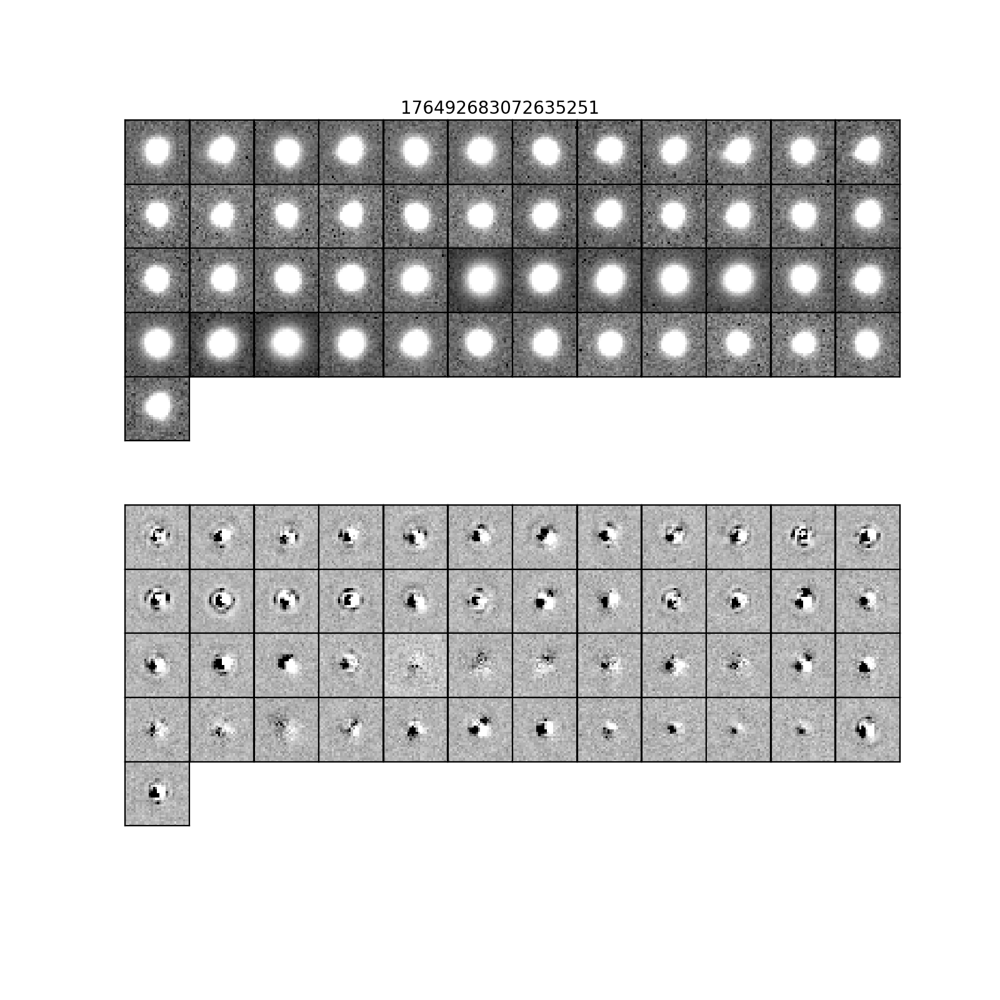

In [19]:
for obj in objTableOld.loc[objSubsetOld, 'diaObjectId'].values[0:3]:
    plotLightcurve(obj, objTableOld, repoOld,
                   'association.db', templateRepo, patchList=patchList,
                   useTotFlux=False, plotAllCutouts=True)

### Maybe the template for this region of sky is just weird??

It's plotted below in all its afwDisplay glory and looks exactly how I would expect. Nothing to see here.

<IPython.core.display.Javascript object>


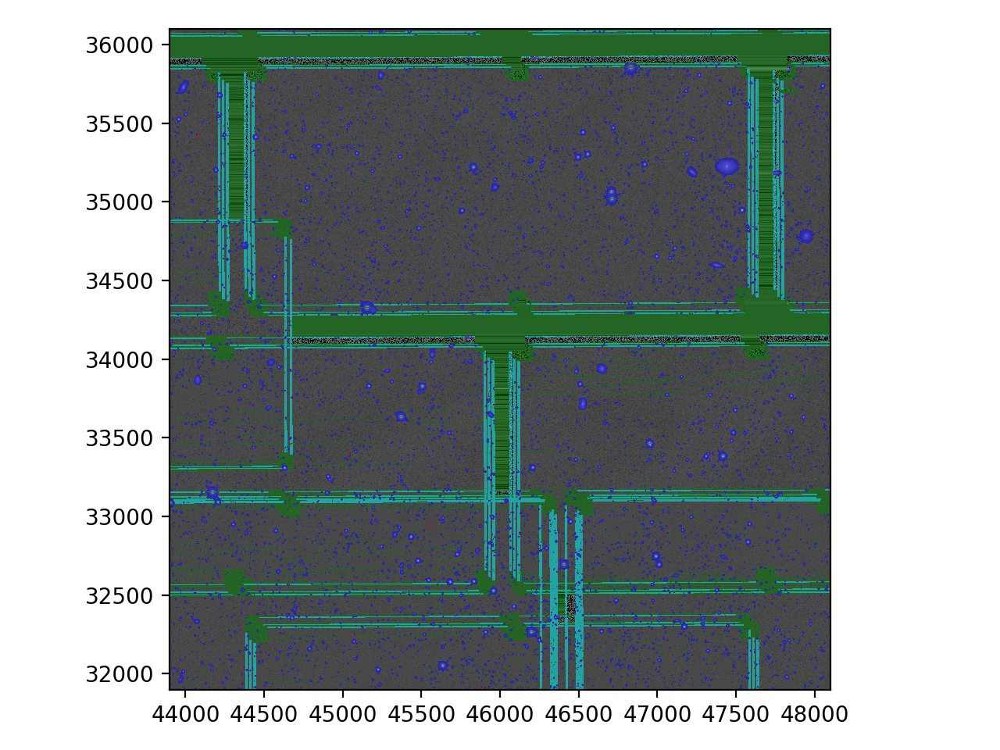

In [20]:
template_11_8_dataId = {'filter': 'g', 'tract': 0, 'patch': '11,8'}
template_11_8 = templateButler.get('deepCoadd', dataId=template_11_8_dataId)
disp1 = afwDisplay.Display(36)
disp1.setMaskTransparency(50)
disp1.scale('asinh', 'zscale', Q=8)
disp1.mtv(template_11_8)

## Gabor's "good" and "bad" handful of ccdVisitIds

In his ongoing exploration of why some of our difference imaging yields really weird residuals on the diffim itself, Gabor has identified some ccd+visit combinations that are particularly egregious and some which look fine. If our problem is related, maybe his "good" ccd+visit combos will exhibit more/less light curve weirdness than his "bad" ones? Let's make moar plots!

In [21]:
ccdVisitIdsGood = [41207406, 41207657, 41226406, 41226657, 41232106, 41251806, 41232457, 41252057, 41256806, 41257057]
ccdVisitIdsBad =  [42160403, 42160406, 42160657, 41092906, 41093157, 41132157, 41136906, 41137157, 41142257]
ccdVisitIdsGood.sort()
ccdVisitIdsBad.sort()

<IPython.core.display.Javascript object>


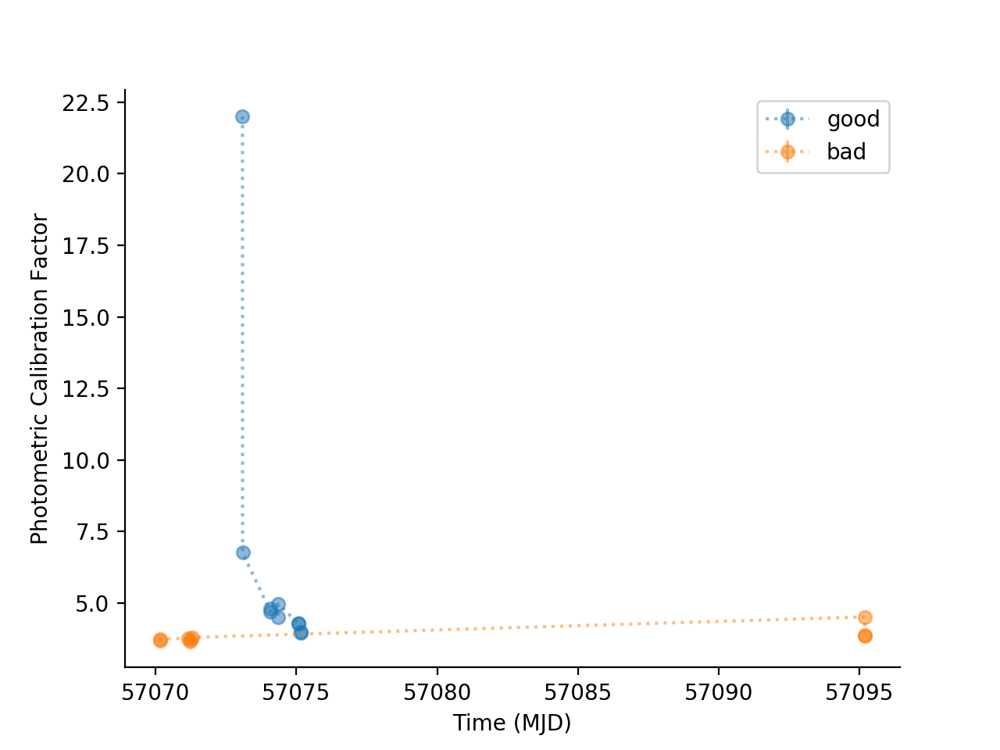

In [22]:
plt.figure()
timeList = []
flux0List = []
flux0ErrList = []
for visit in ccdVisitIdsGood:
    visit = str(visit)
    dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
    visit_info = butler.get('calexp_visitInfo', dataId=dataId)
    time = visit_info.getDate().get(system=DateTime.MJD)
    photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
    flux0 = photoCalib.getCalibrationMean()
    flux0Err = photoCalib.getCalibrationErr()
    timeList.append(time)
    flux0List.append(flux0)
    flux0ErrList.append(flux0Err)
timeListbad = []
flux0Listbad = []
flux0ErrListbad = []
for visitbad in ccdVisitIdsBad:
    visitbad = str(visitbad)
    dataIdbad = {'visit': int(visitbad[0:6]), 'ccdnum': int(visitbad[6:])}
    visit_infobad = butler.get('calexp_visitInfo', dataId=dataIdbad)
    timebad = visit_infobad.getDate().get(system=DateTime.MJD)
    calibbad = butler.get('calexp_photoCalib', dataId=dataIdbad)
    flux0bad = calibbad.getCalibrationMean()
    flux0Errbad = calibbad.getCalibrationErr()
    timeListbad.append(timebad)
    flux0Listbad.append(flux0bad)
    flux0ErrListbad.append(flux0Errbad)
plt.errorbar(timeList, flux0List, yerr=flux0ErrList, ls=':', marker='o', color='C0', alpha=0.5, label='good')
plt.errorbar(timeListbad, flux0Listbad, yerr=flux0ErrListbad, ls=':', marker='o', color='C1', alpha=0.5, label='bad')
plt.xlabel('Time (MJD)')
plt.ylabel('Photometric Calibration Factor')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend()

### Takeaway: the "best" observing conditions (with nice small sharp PSFs and small photometric calibration factors) seem to correlate with "bad" difference image artifacts

This suggests that poor photometric conditions causes some kind of blurring that washes away our problems. Fun, but probably out of scope for this ticket, so let's move along.

## Let's plot all the flux zeropoints (calibration factors) for a few CCDs for all visits

Up until now, we've been mostly looking at things either as per-DIA-Object or for a select set of visitIds, but the problem seems to be *per-visit*, that is, a function of time somehow and not a function of some sources behaving badly (exception: "bright" sources are exceptionally bad, for some definition of "bright") or some CCDs being weird.

In [23]:
visits = [410915, 410929, 410931, 410971, 410985, 410987, 411021, 411035, 411037, 411055, 411069, 411071,
          411255, 411355, 411456, 411707, 411808, 412060, 412307, 412554, 412654, 413635, 415314, 419791,
          411269, 411369, 411470, 411721, 411822, 412074, 412321, 412568, 412668, 413649, 415328, 419802,
          411271, 411371, 411472, 411724, 411824, 412076, 412324, 412570, 412670, 413651, 415330, 419804,
          411305, 411406, 411657, 411758, 411858, 412250, 412504, 412604, 412704, 413680, 415364, 421590,
          411319, 411420, 411671, 411772, 411872, 412264, 412518, 412618, 412718, 413694, 415378, 421604,
          411321, 411422, 411673, 411774, 411874, 412266, 412520, 412620, 412720, 413696, 415380, 421606
         ]
ccds = [5, 10, 43, 57, 60]
visits.sort()  # copy-pasta is hard

In [24]:
dataIds = []
for visit in visits:
    for ccd in ccds:
        dataId = {'visit': visit, 'ccdnum': ccd}
        dataIds.append(dataId)

In [25]:
def plotCalibrationFactor(dataIdList, butler, title=None):
    plt.figure(figsize=(10,4))
    for dataId in dataIdList:
        try:
            visitInfo = butler.get('calexp_visitInfo', dataId=dataId)
        except:
            continue
        else:
            photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
            time = visitInfo.getDate().get(system=DateTime.MJD)
            calibFactor = photoCalib.getCalibrationMean()
            calibErr = photoCalib.getCalibrationErr()
            airmass = visitInfo.getBoresightAirmass()
            if airmass < 1.4:
                plt.errorbar(time, calibFactor, yerr=calibErr, ls='None', marker='o', color='C0', alpha=0.5)
            else:
                plt.errorbar(time, calibFactor, yerr=calibErr, ls='None', marker='o', color='C1', alpha=0.5)
            plt.axvline(time, ls=':', color='0.75')
            # also get the psf
            #calexp = butler.get('calexp', dataId=dataId)
            #psfArea = calexp.getPsf().computeShape().getArea()
            #plt.plot(time, psfArea, marker='o', ls='None', color='C2', alpha=0.5)
    plt.xlabel('Time (MJD)')
    plt.ylabel('Calibration Factor')
    plt.gca().set_xlim([57069, 57081])
    plt.gca().set_ylim([2, 30])
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    if title:
        plt.title(title)

<IPython.core.display.Javascript object>


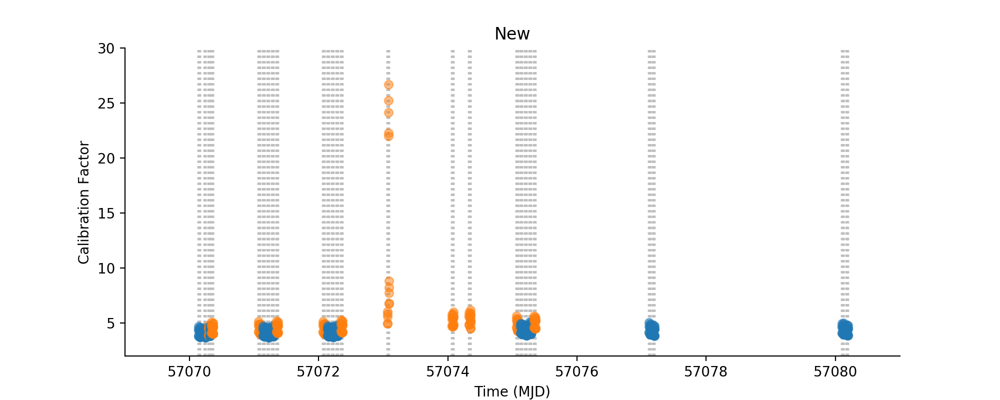

In [26]:
plotCalibrationFactor(dataIds, butler, title='New')

/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


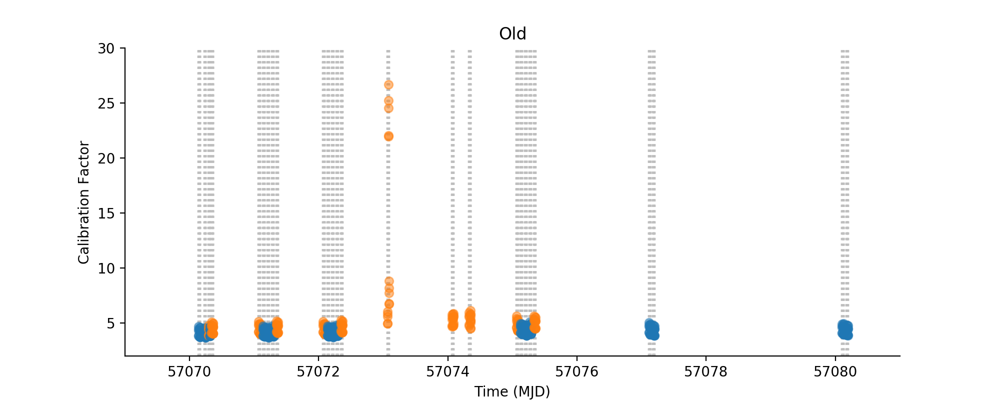

In [27]:
plotCalibrationFactor(dataIds, butlerOld, title='Old')

Once again, the "new" vs. "old" reruns show essentially no difference. The calibration factors are higher when seeing (or other photometric conditions) is poorer, and that's to be expected. You have to multiply by a larger number to get a calibrated flux when sky conditions are garbage. Doing photometric calibrations with a brighter, less-noisy set of refcat sources didn't make an appreciable difference here. Whatever is happening to make our light curves have systematic trends that somehow also follow sky conditions is happening elsewhere.

### Is the PSF fitting going horribly wrong, maybe?

PSFs are fun but also slow, because you have to load the exposure to get at it. Let's do it anyway.

In [28]:
calexp = butler.get('calexp', dataId=dataId)

In [29]:
psf = calexp.getPsf()

In [30]:
psfImage = psf.computeImage()

<IPython.core.display.Javascript object>


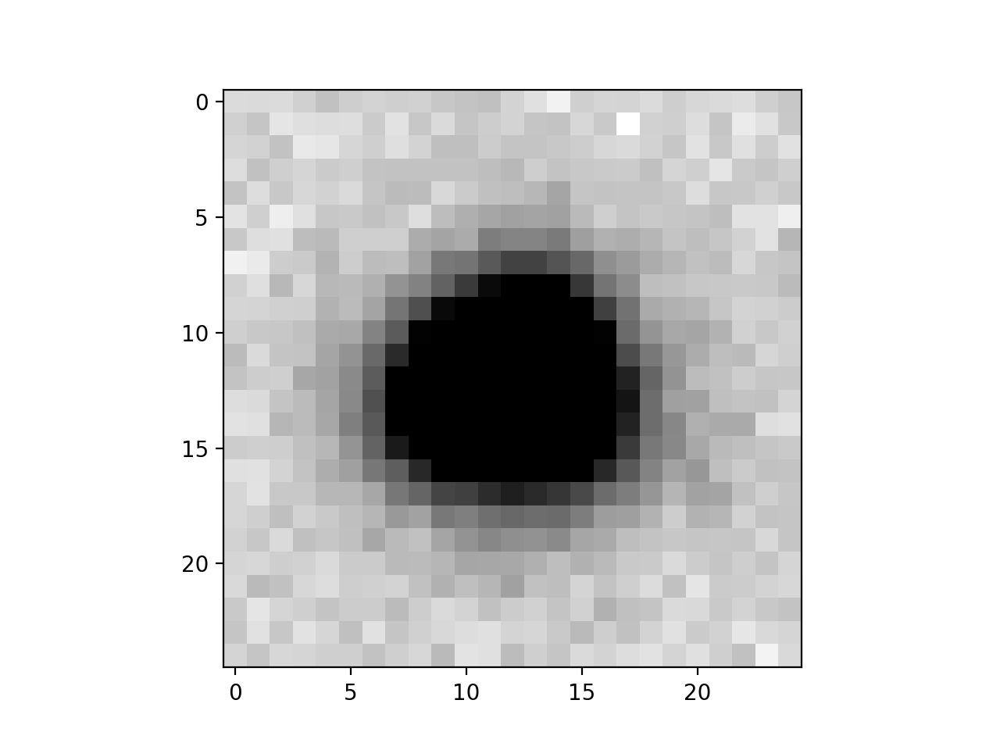

In [31]:
plt.figure()
psfNorm = ImageNormalize(psfImage.array, interval=ZScaleInterval(), stretch=SqrtStretch())
plt.imshow(psfImage.array, norm=psfNorm, cmap='Greys')

In [32]:
len(visits)

84

## Plot the PSF (for one CCD) for all visits

Note the PSF image is automatically scaled, so if you want to see relative sizes, you have to do some shenanigans

In [33]:
def plotPsfs(butler, ccdVisitIdList, imageType='calexp'):
    fig = plt.figure(figsize=(9,9))
    for idx, ccdVisitId in enumerate(ccdVisitIdList):
        #dataId = {'visit': visit, 'ccdnum': ccdnum}
        dataId = {'visit': int(str(ccdVisitId)[0:6]), 'ccdnum': int(str(ccdVisitId)[6:])}
        visitInfo = butler.get(imageType+'_visitInfo', dataId=dataId)
        exposure = butler.get(imageType, dataId=dataId)
        psfImage = exposure.getPsf().computeImage().array
        #print(psfImage.shape)
        #psfNorm = ImageNormalize(psfImage, interval=ZScaleInterval(), stretch=SqrtStretch())
        center = (psfImage.shape[0]/2, psfImage.shape[1]/2)
        ax = fig.add_subplot(10, 10, idx+1)
        #ax.set_xlim(0,25)
        #ax.set_ylim(0,25)
        ax.set_xlim(center[0] - 15, center[0] + 15)
        ax.set_ylim(center[1] - 15, center[1] + 15)
        ax.set_aspect('equal')
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        #plt.axes([0, 30, 0, 30])
        plt.subplots_adjust(hspace=0, wspace=0)
        plt.text(0.1, 0.1, ccdVisitId, size=8, transform=ax.transAxes)
        plt.imshow(psfImage, cmap='Greys')#, norm=psfNorm)

<IPython.core.display.Javascript object>


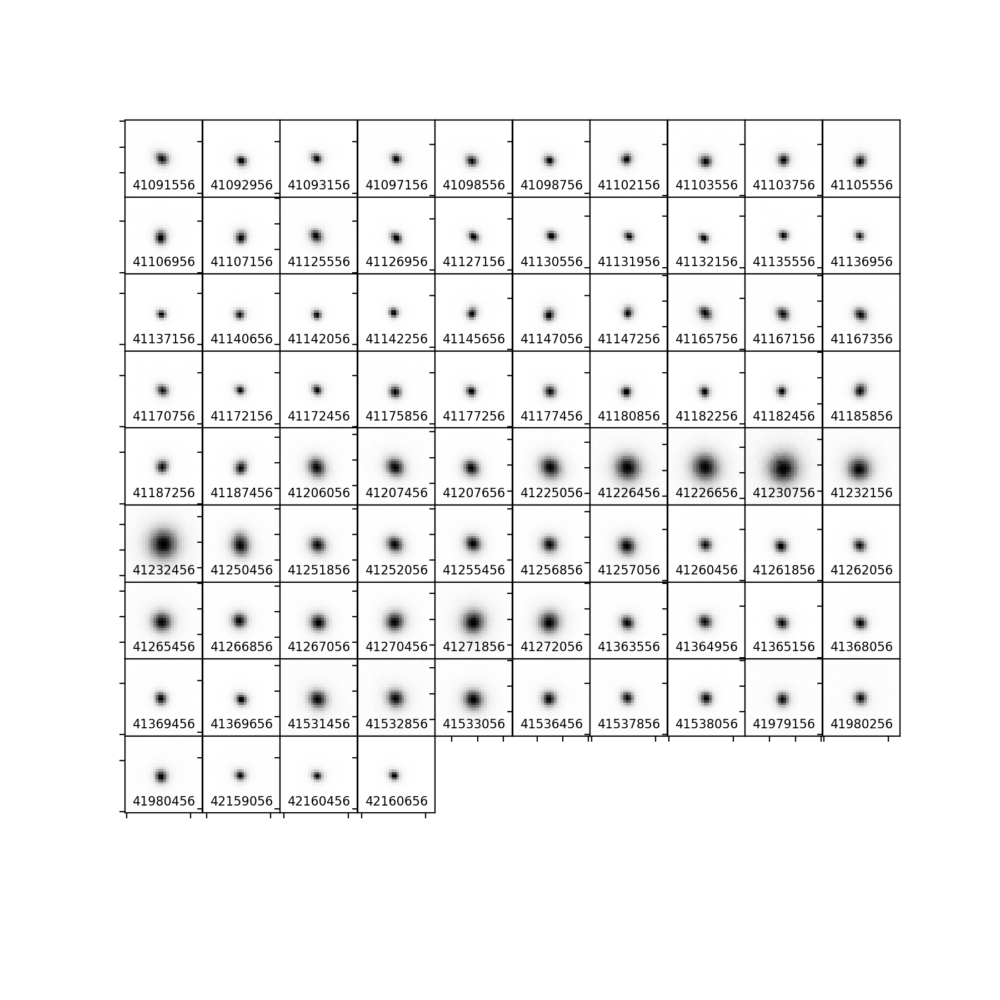

In [34]:
ccdVisitIdList = [int(str(visit)+'56') for visit in visits]
plotPsfs(butler, ccdVisitIdList, imageType='calexp')

In [35]:
shape = psf.computeShape()

In [36]:
shape.getArea()

6.884834068223086

That was fun(?), but once again not particularly insightful. Of course the PSFs are larger/fuzzier on worse nights. But they all look like perfectly reasonable PSFs to my eye.

## Load a calexp source catalog and get calibrated source magnitudes

This whole time we've been talking about "old" and "new" ap_pipe reruns. This is the part where we actually dig into what refcat sources are actually being used to photometrically calibrate the calexp.

In [65]:
dataId = {'visit': 410929, 'ccdnum': 6}

In [66]:
calsrc = butler.get('src', dataId=dataId)
calsrcUsed = calsrc['calib_photometry_used'] == True  # these sources were actually used for photometric calibration

In [67]:
photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
calibMags = photoCalib.instFluxToMagnitude(calsrc, 'slot_CalibFlux')

In [68]:
len(calibMags)

1702

Load a reference catalog and get reference magnitudes

In [69]:
refcatConfig = measAlg.LoadIndexedReferenceObjectsConfig()
refcatConfig.ref_dataset_name = 'ps1_pv3_3pi_20170110'
refObjLoader = measAlg.LoadIndexedReferenceObjectsTask(butler, config=refcatConfig)

In [70]:
bbox = butler.get('calexp_bbox', dataId=dataId)
wcs = butler.get('calexp_wcs', dataId=dataId)
refcat = refObjLoader.loadPixelBox(bbox=bbox, wcs=wcs, filterName='g').refCat

It's cross-match o'clock

In [71]:
match = measAstrom.DirectMatchTask(butler, refObjLoader)
matchResult = match.run(calsrc[calsrcUsed].copy(deep=True), filterName='g')
matches = matchResult.matches  # obviously

In [72]:
len(matches)

81

In [73]:
matchedRefcatGMags = []
matchedRefcatIMags = []
for idx in range(0, len(matches)):
    matchedRefcatGMags.append((matches[idx].first['g_flux']*u.nJy).to_value(u.ABmag))
    matchedRefcatIMags.append((matches[idx].first['i_flux']*u.nJy).to_value(u.ABmag))

In [74]:
print(np.median(matchedRefcatGMags))
print(np.median(matchedRefcatIMags))
len(matchedRefcatGMags)

18.69428744102858
17.170306357110427


81

### Wrapping up the above in a nice function

In [75]:
def compareSrcAndRefcat(dataId, butler):
    calsrc = butler.get('src', dataId=dataId)
    calsrcUsed = calsrc['calib_photometry_used'] == True
    photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
    calibMags = photoCalib.instFluxToMagnitude(calsrc, 'slot_CalibFlux')
    refcatConfig = measAlg.LoadIndexedReferenceObjectsConfig()
    refcatConfig.ref_dataset_name = 'ps1_pv3_3pi_20170110'
    refObjLoader = measAlg.LoadIndexedReferenceObjectsTask(butler, config=refcatConfig)
    bbox = butler.get('calexp_bbox', dataId=dataId)
    wcs = butler.get('calexp_wcs', dataId=dataId)
    refcat = refObjLoader.loadPixelBox(bbox=bbox, wcs=wcs, filterName='g').refCat
    
    fig = plt.figure(figsize=(7,10))
    plt.subplots_adjust(hspace=0.5)
    
    ax1 = fig.add_subplot(411)
    ax1.set_ylim([0, 100])
    histParams = dict(range=[15,25], bins=100, histtype='step')
    plt.hist((refcat['g_flux']*u.nJy).to_value(u.ABmag), label='PS1', **histParams)
    plt.hist(calibMags[:,0], label='HiTS (all)', **histParams)
    plt.hist(calibMags[calsrcUsed,0], label='HiTS (used)', **histParams)
    plt.xlabel('g mag')
    plt.ylabel('Count')
    plt.legend(loc='upper left')
    plt.title(str(dataId))
    
    match = measAstrom.DirectMatchTask(butler, refObjLoader)
    matchResult = match.run(calsrc[calsrcUsed].copy(deep=True), filterName='g')
    matches = matchResult.matches  # obviously
    #matches[0].first is the reference catalog
    #matches[0].second is the source catalog entry matched to reference catalog
    matchedRefcatGMags = []
    matchedRefcatIMags = []
    for idx in range(0, len(matches)):
        matchedRefcatGMags.append((matches[idx].first['g_flux']*u.nJy).to_value(u.ABmag))
        matchedRefcatIMags.append((matches[idx].first['i_flux']*u.nJy).to_value(u.ABmag))
    matchedCalsrcIdxs = []
    matchedCalsrcMags = []
    matchedCalsrcErrs = []
    matchedCalsrcFluxes = []
    matchedCalsrcFluxErrs = []
    for i, calsrcId in enumerate(calsrc['id']):
        for idx in range(0, len(matches)):
            if matches[idx].second['id'] == calsrcId:
                #print(calsrc[i])
                matchedCalsrcIdxs.append(idx)
                matchedCalsrcMags.append(photoCalib.instFluxToMagnitude(calsrc[i], 'slot_CalibFlux').value)
                matchedCalsrcErrs.append(photoCalib.instFluxToMagnitude(calsrc[i], 'slot_CalibFlux').error)
                matchedCalsrcFluxes.append(calsrc[i].get('slot_CalibFlux_instFlux'))
                matchedCalsrcFluxErrs.append(calsrc[i].get('slot_CalibFlux_instFluxErr'))
                #matchedCalsrcFluxes.append(photoCalib.instFlux(calsrc[i], 'slot_CalibFlux'))
                #matchedCalsrcFluxErrs.append(photoCalib.instFluxError(calsrc[i], 'slot_CalibFlux'))
    matchedCalsrcIdxs, matchedCalsrcMags, matchedCalsrcErrs = zip(*sorted(zip(matchedCalsrcIdxs, matchedCalsrcMags, matchedCalsrcErrs)))
    matchedCalsrcIdxs = list(matchedCalsrcIdxs)
    matchedCalsrcMags = list(matchedCalsrcMags)
    matchedCalsrcErrs = list(matchedCalsrcErrs)
    matchedCalsrcFluxes = list(matchedCalsrcFluxes)
    matchedCalsrcFluxErrs = list(matchedCalsrcFluxErrs)

    ax2 = fig.add_subplot(412)
    histParams2 = dict(range=[0, 500], bins=100)#, histtype='step')#, log=True)
    #ax2.set_ylim([0, 50])
    label = 'There are ' + str((np.array(matchedCalsrcFluxes)/np.array(matchedCalsrcFluxErrs) > 40).sum()) + ' matched reference sources with SNR > 40'
    plt.hist(np.array(matchedCalsrcFluxes)/np.array(matchedCalsrcFluxErrs), label=label, **histParams2)
    plt.xlabel('Source catalog SNR (instFlux/instFluxErr)')
    plt.ylabel('Count')
    plt.legend()
    #plt.title(str((np.array(matchedCalsrcFluxes)/np.array(matchedCalsrcFluxErrs) > 40).sum()) + 'with SNR > 40')
    
    ax3 = fig.add_subplot(413)
    plt.errorbar(np.array(matchedCalsrcMags), np.array(matchedCalsrcMags) - np.array(matchedRefcatGMags), 
                 yerr=matchedCalsrcErrs, alpha=0.5, marker='o', ls='None')
    plt.xlabel('Src g')
    plt.ylabel('Src g - Refcat g')
    plt.axhline(y=0, ls=':', c='0.5')
    ax3.set_ylim([-0.4, 0.4])
    
    ax4 = fig.add_subplot(414)
    plt.errorbar(np.array(matchedRefcatGMags) - np.array(matchedRefcatIMags), 
                 np.array(matchedCalsrcMags) - np.array(matchedRefcatGMags), 
                 yerr=matchedCalsrcErrs, marker='o', ls='None', alpha=0.5)
    plt.xlabel('Refcat (g - i)')
    plt.ylabel('Src g - Refcat g')
    plt.axhline(y=0, ls=':', c='0.5')
    ax4.set_ylim([-0.4, 0.4])

## This is what the original photometric calibration looked like

i.e., for the "old" rerun, with no refcat magnitude cut, for a single pseudo-random visit+ccd

<IPython.core.display.Javascript object>


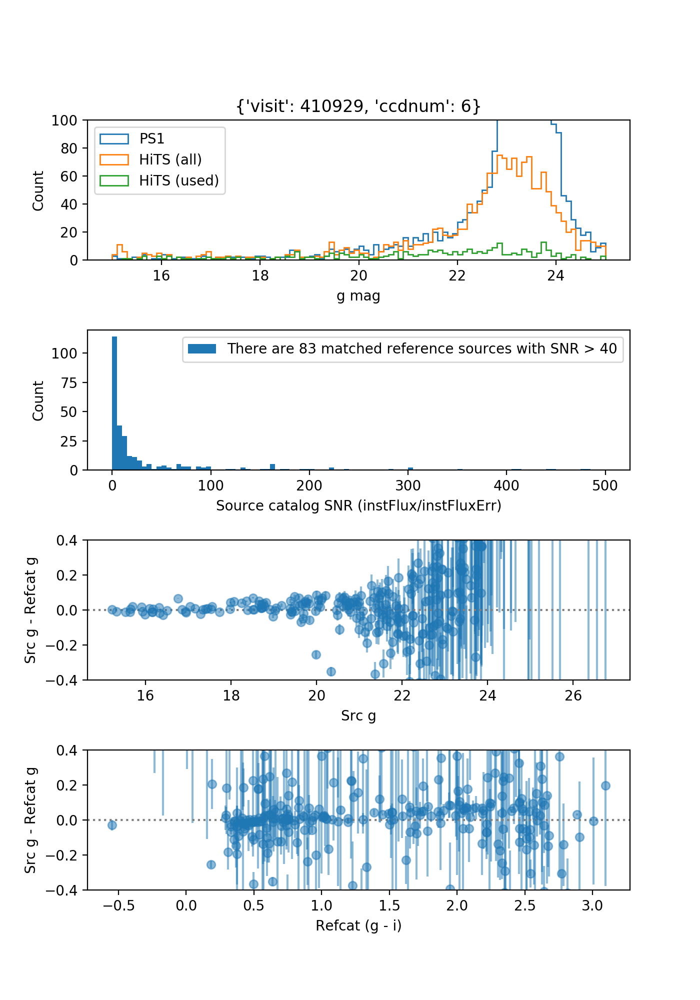

/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


In [76]:
dataId = {'visit': 410929, 'ccdnum': 6}
compareSrcAndRefcat(dataId, butlerOld)

## And this is what it looks like with a magnitude cut

i.e., for the "new" rerun, now with a PS1 r-band 22 magnitude cut imposed like obs_subaru does by default. It looks much nicer! We should probably be choosing photometric calibration reference sources like this, or with a signal-to-noise cut once we have proper refcat error bars and can calculate such a thing! But as we already saw, this improvement doesn't fix the problem we're here to fix. Alas.

<IPython.core.display.Javascript object>


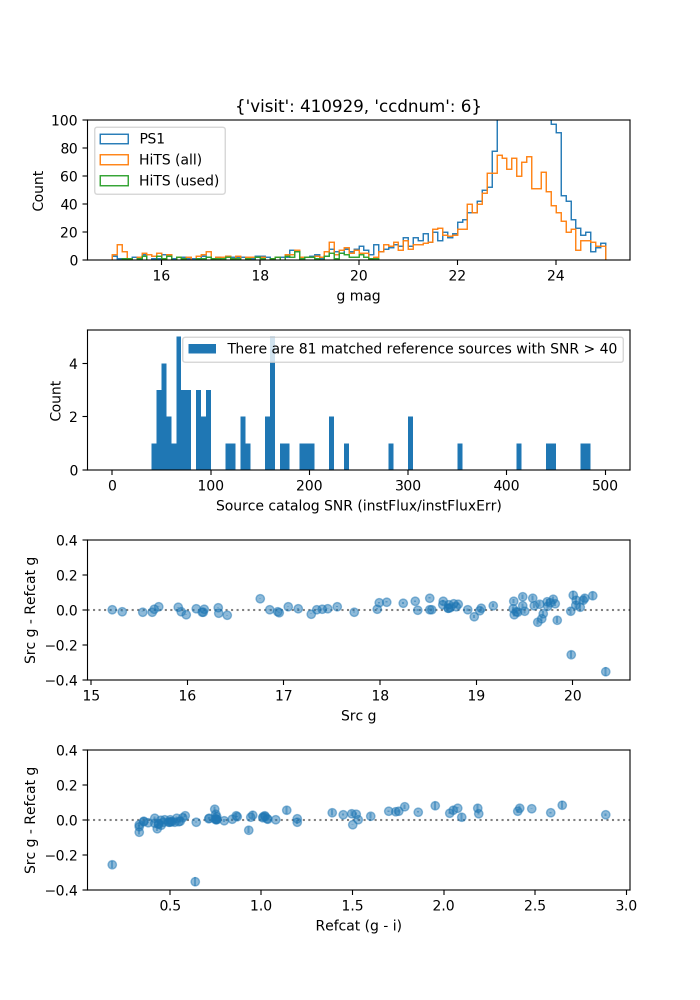

In [77]:
dataId = {'visit': 410929, 'ccdnum': 6}
compareSrcAndRefcat(dataId, butler)

## We have improved the photometric calibration, but it appears to have had a negligible effect on the resulting light curves, which are still systematically affected by the calibration factor to some degree by eye

Let's plot postage stamps (calexp + diffim) for individual bad sources/visits

We're going to look at this DIA Object in depth:

* DIAObject ID: 176492665892766198 (in both rerun)
* RA (rad): [2.70446477]
* Dec (rad): [-0.09860521]
* Number of DIASources: 48
* Template patch: 12,8

Loading PPDB Sources...
DIAObject ID: 176492665892766198
RA (rad): [2.70446477]
Dec (rad): [-0.09860521]
Number of DIASources: 48
Template patch: 12,8


<IPython.core.display.Javascript object>


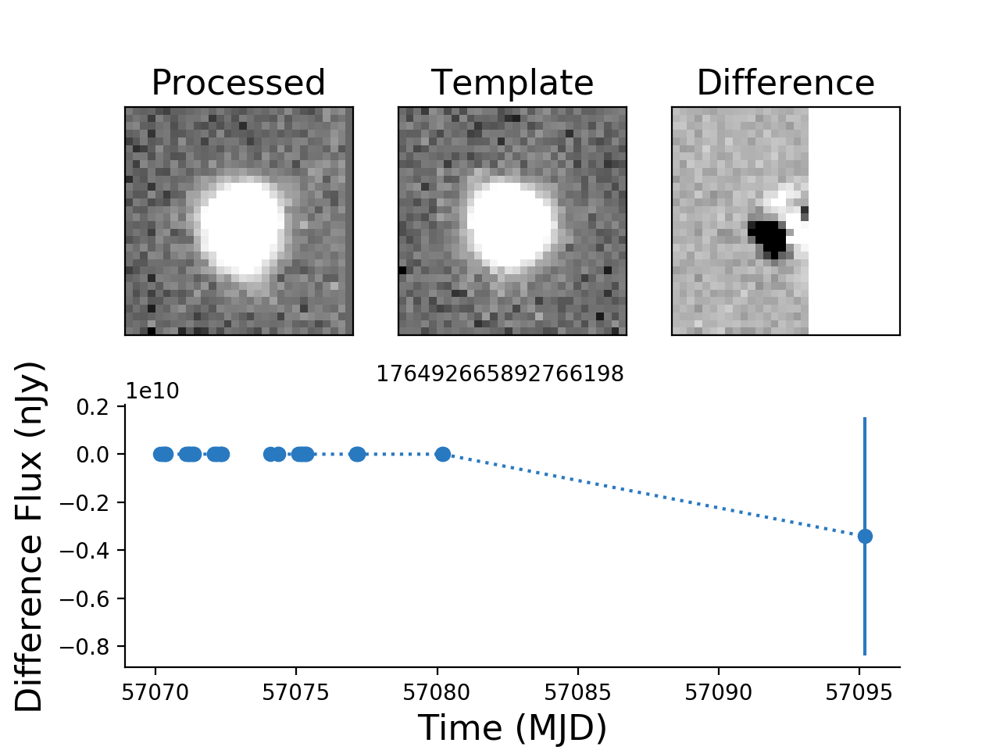

<IPython.core.display.Javascript object>


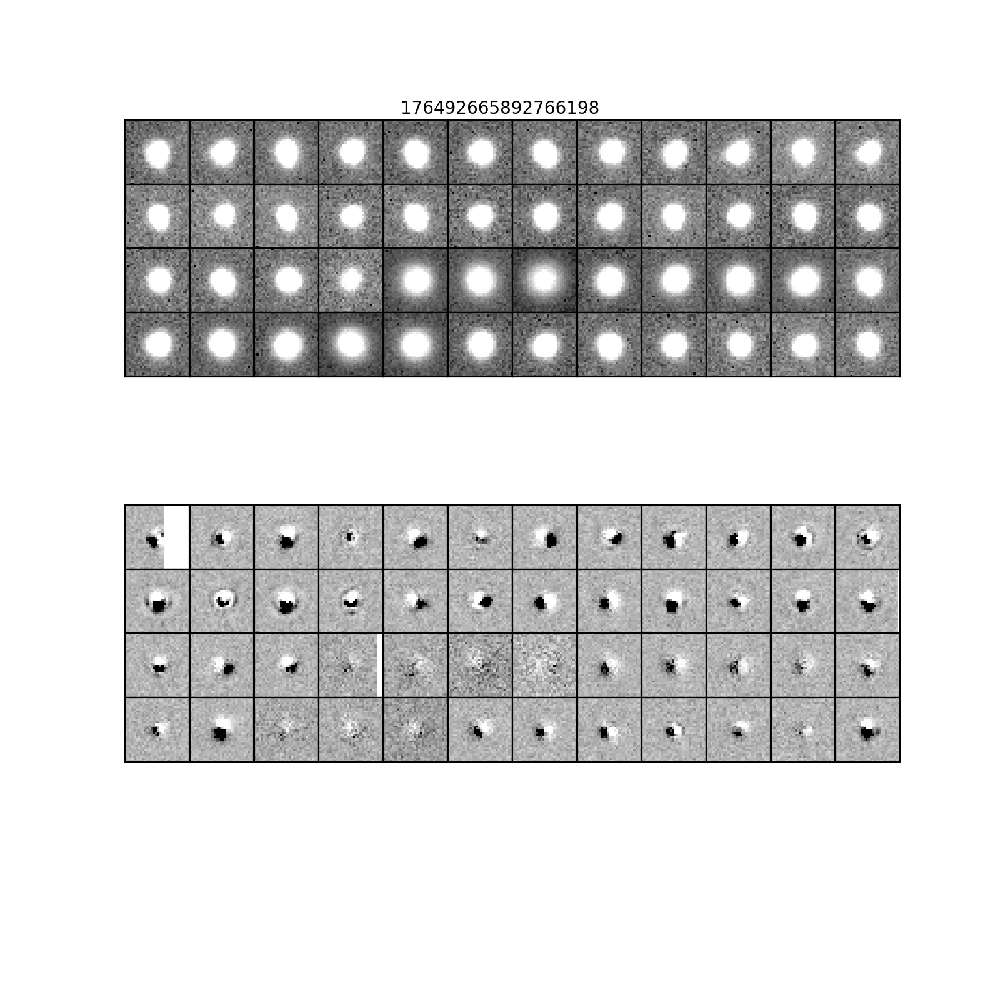

In [78]:
objIdTest = 176492665892766198
plotLightcurve(objIdTest, objTable, repo, 'association.db', templateRepo, patchList=patchList,
               useTotFlux=False, plotAllCutouts=True)

Loading PPDB Sources...
DIAObject ID: 176492665892766198
RA (rad): [2.70446477]
Dec (rad): [-0.09860521]
Number of DIASources: 48
Template patch: 12,8


<IPython.core.display.Javascript object>


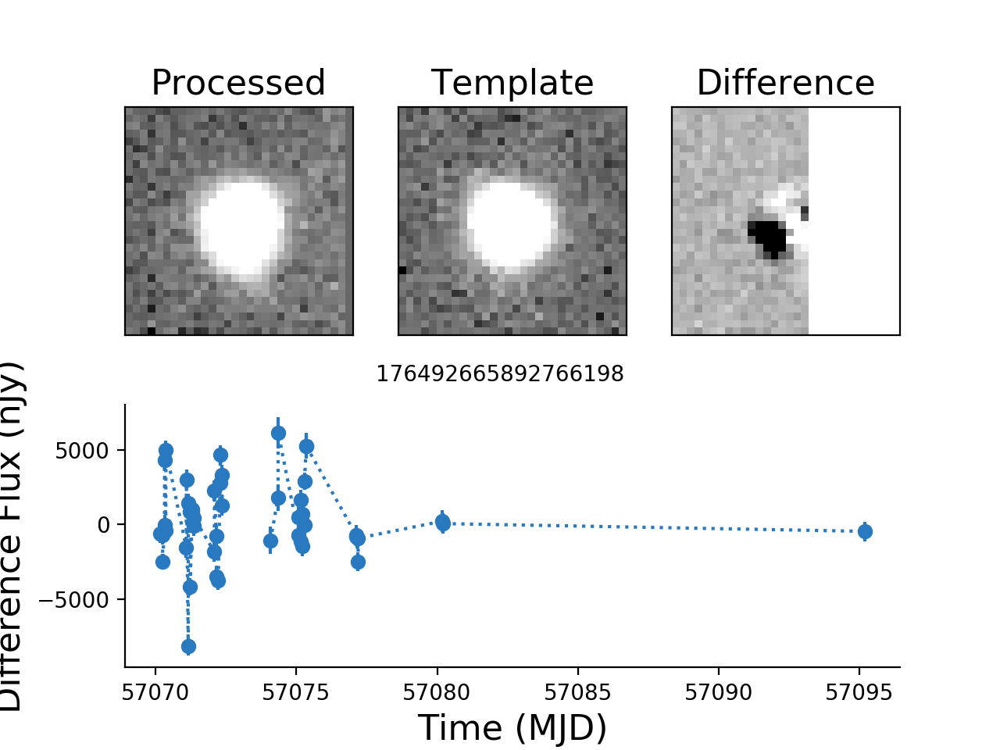

<IPython.core.display.Javascript object>


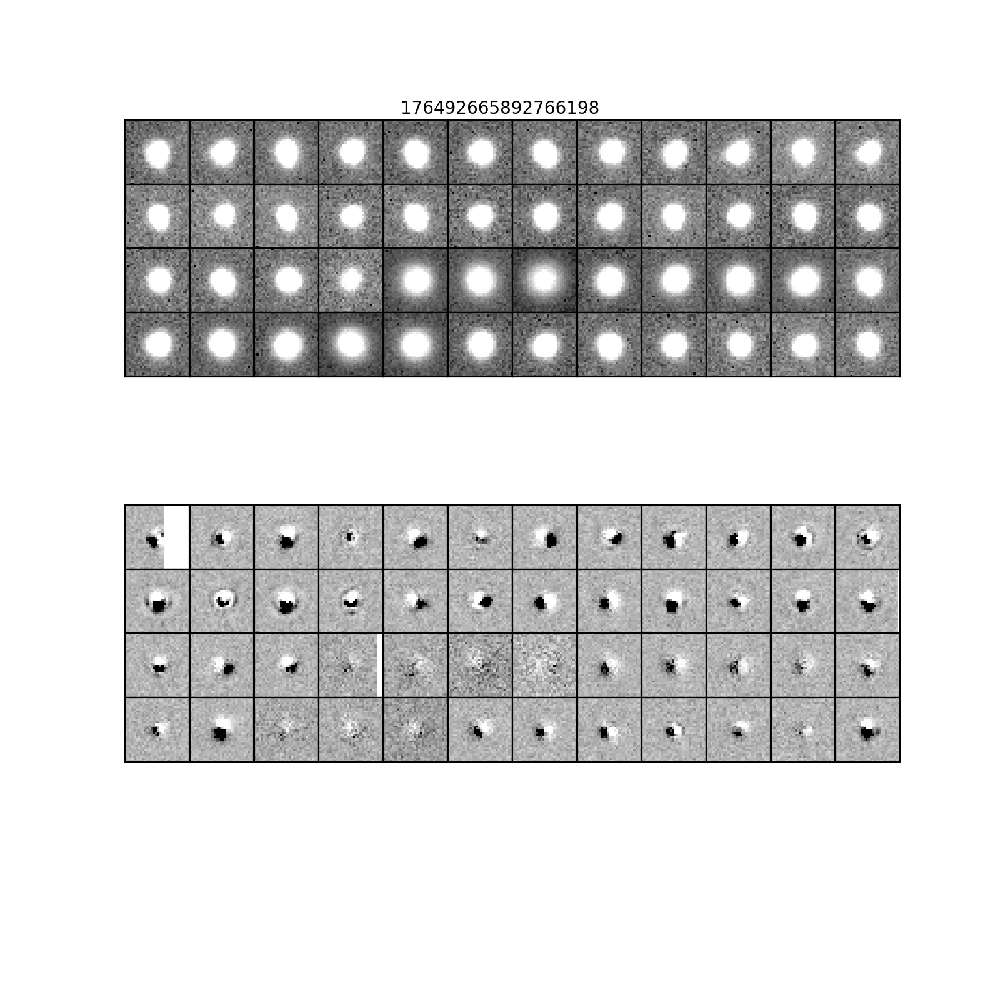

In [79]:
plotLightcurve(objIdTest, objTableOld, repoOld, 'association.db', templateRepo, patchList=patchList,
               useTotFlux=False, plotAllCutouts=True)

Confirmed, the DIAObject ID is the same for this object in both reruns

In [80]:
objTable.loc[objTable['diaObjectId'] == objIdTest]

,diaObjectId,ra,decl,nDiaSources,gPSFluxMean,validityEnd,flags
439945,176492665892766198,154.954417,-5.649662,48,232.006454,None,1


In [81]:
objTableOld.loc[objTableOld['diaObjectId'] == objIdTest]

,diaObjectId,ra,decl,nDiaSources,gPSFluxMean,validityEnd,flags
444403,176492665892766198,154.954417,-5.649662,48,219.565369,None,1


In [82]:
srcTable = loadSources(repo, objIdTest)
srcTableOld = loadSources(repoOld, objIdTest)

In [84]:
srcTable[0:3]

,diaSourceId,diaObjectId,ccdVisitId,midPointTai,apFlux,psFlux,apFluxErr,psFluxErr,totFlux,totFluxErr,flags
0,176492665892766198,176492665892766198,41092901,57070.160574,NaN,NaN,NaN,NaN,81550.798824,334.918177,25299176
1,176493761109426670,176492665892766198,41093156,57070.163265,-768.469016,-610.694105,844.953439,637.766446,237632.037062,627.807676,25168040
2,176516717709623719,176492665892766198,41098501,57070.246478,-1896.797233,-706.020379,866.587292,648.740385,244989.237572,647.522775,25169320


In [85]:
srcTable['ccd'] = srcTable['ccdVisitId'] % 100  # add a new column to the dataframe

In [86]:
# Save the RA, Dec of the DIA Object we're working with
raTest = objTable.loc[objTable['diaObjectId'] == objIdTest, 'ra']
decTest = objTable.loc[objTable['diaObjectId'] == objIdTest, 'decl']
# This is an astropy skyCoord of the DIA Object coordinates
skyCoordTest = coord.SkyCoord(raTest, decTest, unit=u.degree)

srccatTimes = []
srccatCalibFluxes = []
srccatCalibFluxErrs = []

for visit in srcTable['ccdVisitId']:
    dataId = {'visit': int(str(visit)[0:6]), 'ccdnum': int(str(visit)[6:])}
    calsrc = butler.get('src', dataId=dataId)
    calsrcBetter = calsrc.asAstropy()
    calsrcSkyCoord = coord.SkyCoord(calsrcBetter['coord_ra'], calsrcBetter['coord_dec'], unit=u.rad)
    matchIdx, matchAngle, match3d = skyCoordTest.match_to_catalog_sky(calsrcSkyCoord)
    if matchAngle < 2.0*u.arcsecond:  # only use good matches
        ra = calsrcBetter['coord_ra'][matchIdx]
        dec = calsrcBetter['coord_dec'][matchIdx]
        #print(ra, dec)
        visit_info = butler.get('calexp_visitInfo', dataId=dataId)
        time = visit_info.getDate().get(system=DateTime.MJD)
        photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
        #calibMean = photoCalib.getCalibrationMean()
        #calibErr = photoCalib.getCalibrationErr()
        calibFlux = photoCalib.instFluxToNanojansky(calsrc, 'base_PsfFlux')[matchIdx]
        srccatTimes.append(time)
        srccatCalibFluxes.append(calibFlux[0,0])
        srccatCalibFluxErrs.append(calibFlux[0,1])    

### For one object, we want to plot light curves alongside things that might be screwing up said light curves

Some of those things include...
* One or more of the fluxes in the PPDB, i.e., totFlux (calexp flux with diffim PSF), psFlux (diffim PSF flux), and apFlux (diffim aperture flux)
* The for-reals PSF flux from the calexp source catalog which knows nothing about difference imaging whatsoever
* Photometric calibration factors?
* PSF sizes?
* How far off the source centroid is from the average object centroid? **ding ding ding**

In [87]:
def plotFluxCompare(repo, objId, objTable, twoPanelsByCcd=False, plotPsf=False, 
                    fluxStrs = ['totFlux', 'psFlux', 'apFlux']):
    srcTable = loadSources(repo, objId)
    srcTable['ccd'] = srcTable['ccdVisitId'] % 100  # add a new column to the dataframe
    
    fig = plt.figure(figsize=(9,4))

    raObj = objTable.loc[objTable['diaObjectId'] == objId, 'ra']
    decObj = objTable.loc[objTable['diaObjectId'] == objId, 'decl']
    skyCoordObj = coord.SkyCoord(raObj, decObj, unit=u.degree)

    for fluxStr in fluxStrs:
        if fluxStr == 'totFlux':
            ccdList = []
            label='totFlux (scaled)'
            fluxToPlot = srcTable[fluxStr]/100
            fluxErrToPlot = srcTable[fluxStr+'Err']/100
        else:
            label = fluxStr
            fluxToPlot = srcTable[fluxStr]
            fluxErrToPlot = srcTable[fluxStr+'Err']
        if twoPanelsByCcd:
            ax1 = fig.add_subplot(211)
            ccd = list(set(srcTable['ccd']))[0]
            fluxToPlot = srcTable.loc[srcTable['ccd'] == ccd, fluxStr]
            fluxErrToPlot = srcTable.loc[srcTable['ccd'] == ccd, fluxStr+'Err']
            if fluxStr == 'totFlux':
                fluxToPlot = fluxToPlot/100
                fluxErrToPlot = fluxErrToPlot/100
            ax1.errorbar(srcTable.loc[srcTable['ccd'] == ccd, 'midPointTai'], fluxToPlot, yerr=fluxErrToPlot,
                         marker='o', ls=':', alpha=0.5, label=label)

            ax2 = fig.add_subplot(212)
            ccd = list(set(srcTable['ccd']))[1]
            fluxToPlot = srcTable.loc[srcTable['ccd'] == ccd, fluxStr]
            fluxErrToPlot = srcTable.loc[srcTable['ccd'] == ccd, fluxStr+'Err']
            if fluxStr == 'totFlux':
                fluxToPlot = fluxToPlot/100
                fluxErrToPlot = fluxErrToPlot/100
            ax2.errorbar(srcTable.loc[srcTable['ccd'] == ccd, 'midPointTai'], fluxToPlot, yerr=fluxErrToPlot,
                         marker='o', ls=':', alpha=0.5, label=label)
        else:
            plt.errorbar(srcTable['midPointTai'], fluxToPlot, yerr=fluxErrToPlot, 
                         marker='o', ls=':', alpha=0.5, label=label)

    timeList = []
    calibMeanList = []
    calibErrList = []
    psfAreaList = []
    sepList = []
    srccatCalibFluxes = []
    srccatCalibFluxErrs = []
    for visit in srcTable['ccdVisitId']:
        visit = str(visit)
        dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
        visit_info = butler.get('calexp_visitInfo', dataId=dataId)
        time = visit_info.getDate().get(system=DateTime.MJD)
        photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
        calibMean = photoCalib.getCalibrationMean()
        calibErr = photoCalib.getCalibrationErr()
        timeList.append(time)
        calibMeanList.append(calibMean)
        calibErrList.append(calibErr)
        calsrc = butler.get('src', dataId=dataId)
        calsrcAstropy = calsrc.asAstropy()
        calsrcSkyCoord = coord.SkyCoord(calsrcAstropy['coord_ra'], calsrcAstropy['coord_dec'], unit=u.rad)
        matchIdx, matchAngle, match3d = skyCoordObj.match_to_catalog_sky(calsrcSkyCoord)
        sep = calsrcSkyCoord[matchIdx].separation(skyCoordObj).arcsecond
        sepList.append(sep[0])
        calibFlux = photoCalib.instFluxToNanojansky(calsrc, 'base_PsfFlux')[matchIdx]
        srccatCalibFluxes.append(calibFlux[0,0])
        srccatCalibFluxErrs.append(calibFlux[0,1]) 
        if plotPsf:
            # also get the psf (slow)
            calexp = butler.get('calexp', dataId=dataId)
            psfArea = calexp.getPsf().computeShape().getArea()
            psfAreaList.append(psfArea)

    if twoPanelsByCcd:
        ax1.errorbar(timeList, np.array(srccatCalibFluxes)/100, yerr=np.array(srccatCalibFluxErrs)/100, 
                     marker='o', ls=':', alpha=0.5, label='srccatFlux')
        ax1.errorbar(timeList, np.array(calibMeanList)*300, yerr=np.array(calibErrList)*300, 
                     marker='d', ls=':', alpha=0.5, label='Calib factor (scaled)')
        ax1.plot(timeList, np.array(sepList)*10000, marker='s', ls=':', alpha=0.5, label='coord offset (arcsec)')
        if plotPsf:
            ax1.plot(timeList, np.array(psfAreaList)*100, marker='*', ls=':', alpha=0.5, label='PSF Area (scaled)')
        
        ax1.set_ylim(-5000, 5000)
        ax1.legend()

    else:
        plt.errorbar(timeList, np.array(srccatCalibFluxes)/100, yerr=np.array(srccatCalibFluxErrs)/100, 
                     marker='o', ls=':', alpha=0.5, label='srccatFlux')
        plt.errorbar(timeList, np.array(calibMeanList)*300, yerr=np.array(calibErrList)*300, 
                     marker='d', ls=':', alpha=0.5, label='Calib factor (scaled)')
        plt.plot(timeList, np.array(sepList)*10000, marker='s', ls=':', alpha=0.5, label='coord offset (scaled)')
        if plotPsf:
            plt.plot(timeList, np.array(psfAreaList)*100, marker='*', ls=':', alpha=0.5, label='PSF Area (scaled)')
         

        plt.gca().set_ylim(-5000, 5000)
        plt.legend()
    
    plt.xlabel('Time (MJD)')
    #ax2.legend()
    #ax2.set_ylim(-10000, 10000)

## These plots illustrate the final takeaway from this ticket!!!

### The calibration factor is a red herring and the real issue is that the diffims have such non-PSF-shaped sources that the centroid is not a good representation of the source's true location

In the plots below, we see a few things
* totFlux: calexp flux measured **at the diffim PSF centroid location** (note this is what we store in the PPDB; psFlux and apFlux measured directly on the diffim show similar and even noisier flux variability)
* srccatFlux: calexp flux measured properly, i.e., after applying photometric calibration to the calexp source catalog's PSF flux
* Calib factor: calibration factor from the photoCalib object (used to compute both totFlux and srccatFlux from instrumental counts to calibrated fluxes); multiplied by an artitrary constant for clarity
* coord offset: distance on the sky (e.g., in arcseconds) the DIASource coordinate lies from the DIAObject coordinate (which is by definition the average of the DIASource coordinates)

The "problem" is how the totFlux and srccatFlux differ in that the totFlux light curve bounces all over the place.

The original suspected cause was the calibration factor, which can be thought of like a photometric zeropoint, since at a glance it seemed that the variations in the calibration factor were behaving similarly to the spurious totFlux (and psFlux and apFlux) light curve variations. Lots of work was done in this notebook to dig into that, and we did find there were no cuts being done on the reference catalog sources used for photometric calibrations when there probably should be. However, adding a magnitude cut (as is standard for obs_subaru processing) had a negligible effect on the light curves.

We examined PSF sizes next, and found that they vary as expected; larger for nights with larger calibration factors (bad seeing/higher airmass/other non-photometric sky condition).

Finally we remembered that the DIASources presently look like garbage on the diffims themselves, as can be seen in various postage stamps above. They are not nice PSF-shaped sources, but instead look like bulls-eyes or dipoles or sad panda emojis. And since the totFlux (and apFlux and psFlux) are all measured **by plopping the PSF down at the location of the DIASource**, those measurements are likely not happening in quite the right spot to capture all of the desired flux.

We verified this by computing how far the DIASource coordinates lie from the DIAObject coordinate. The trend is indeed similar to the variations of the totFlux light curve, albeit at a much smaller amplitude, partly because this is a crude 1D representation of where the measurement is taking place on the sky relative to where it "should" be.

The proposed solution is to fix the diffims to not look like garbage and hope that makes the problem go away. Gabor is working on this :D

<IPython.core.display.Javascript object>


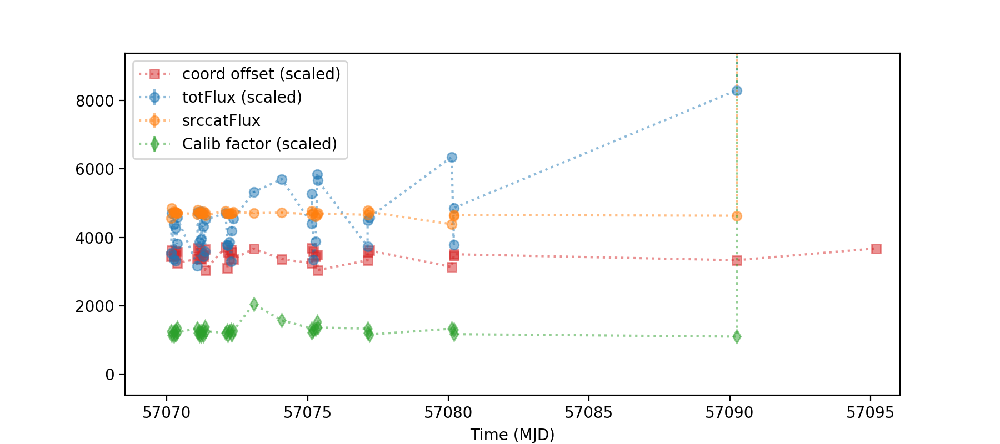

<IPython.core.display.Javascript object>


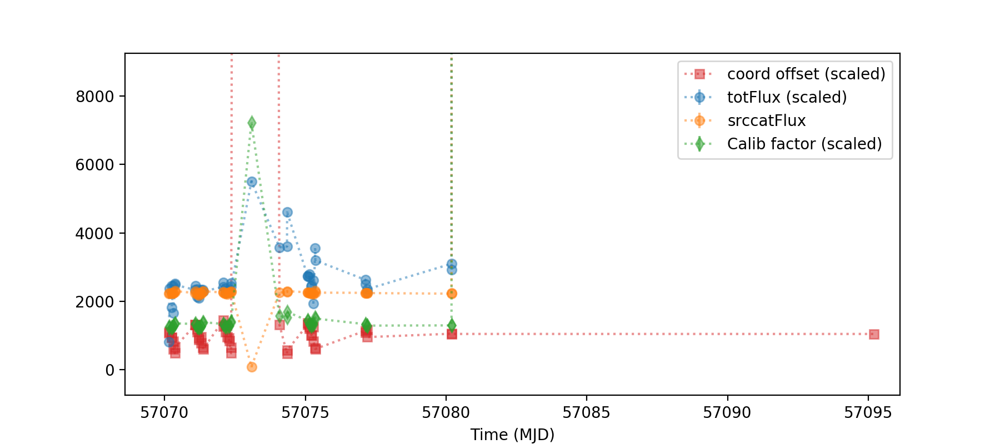

<IPython.core.display.Javascript object>


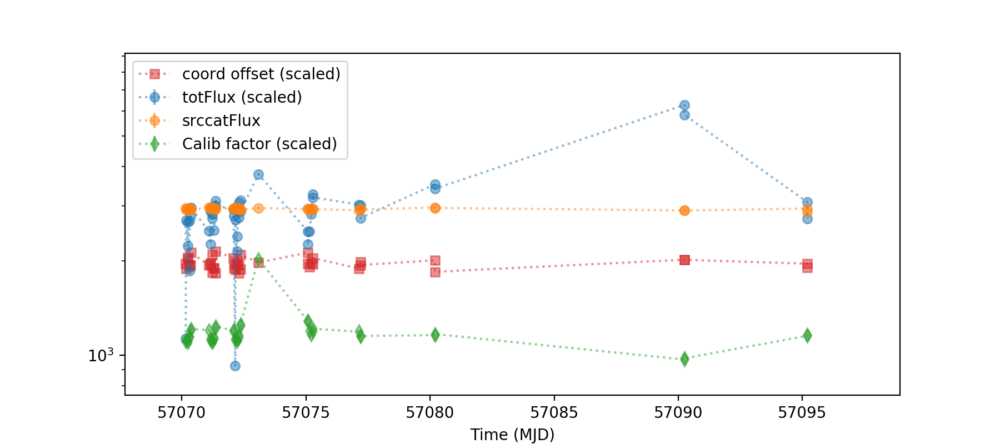

<IPython.core.display.Javascript object>


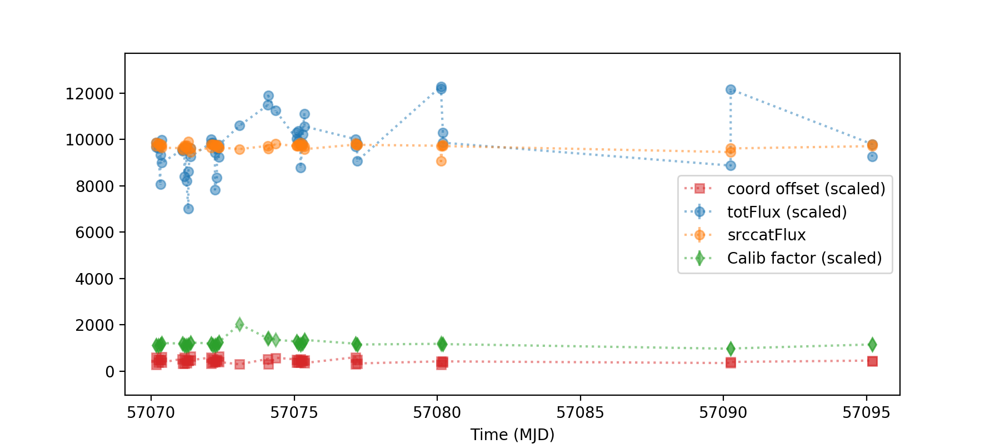

<IPython.core.display.Javascript object>


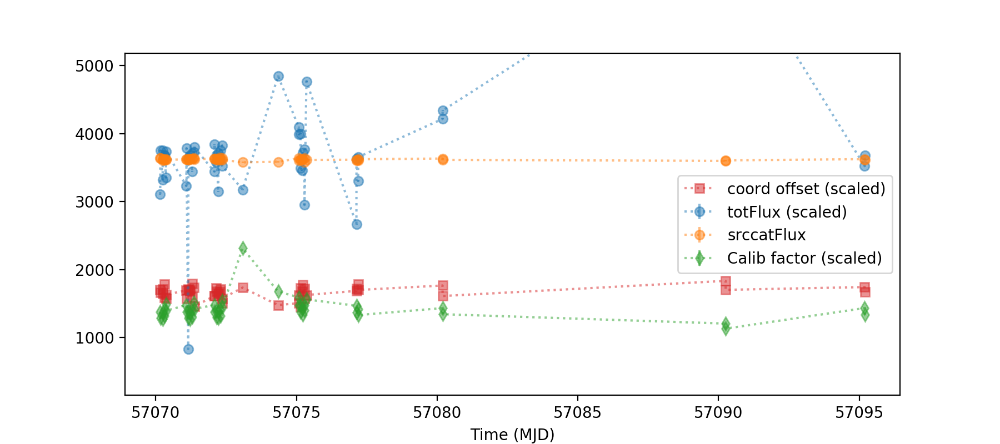

<IPython.core.display.Javascript object>


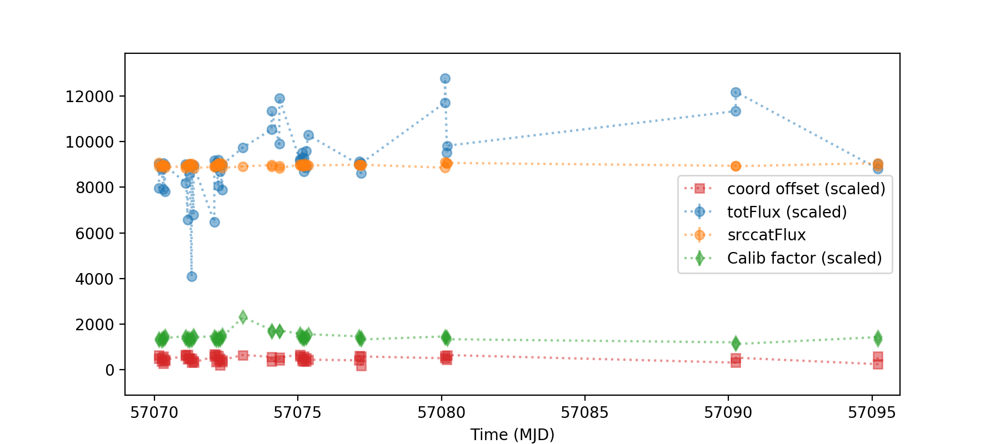

<IPython.core.display.Javascript object>


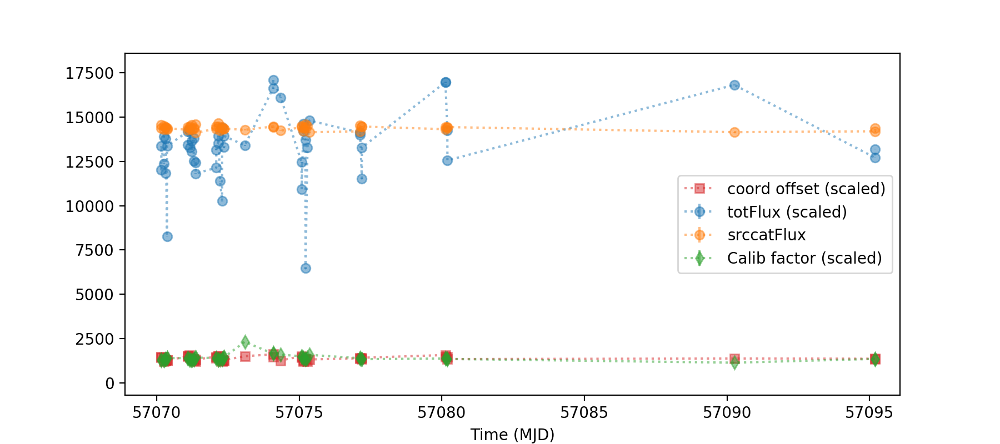

<IPython.core.display.Javascript object>


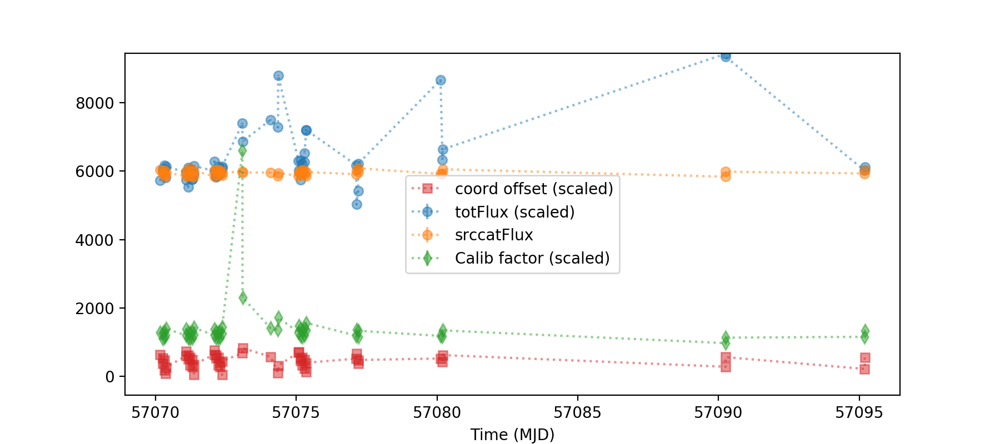

<IPython.core.display.Javascript object>


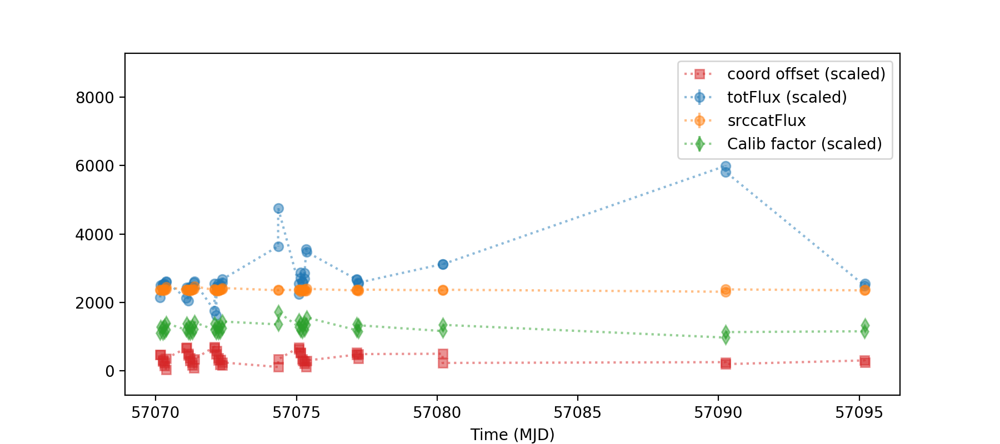

<IPython.core.display.Javascript object>


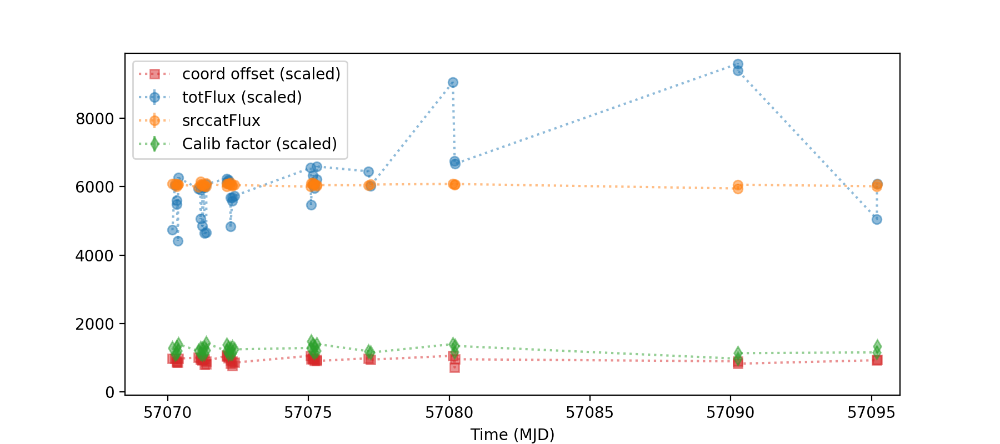

<IPython.core.display.Javascript object>


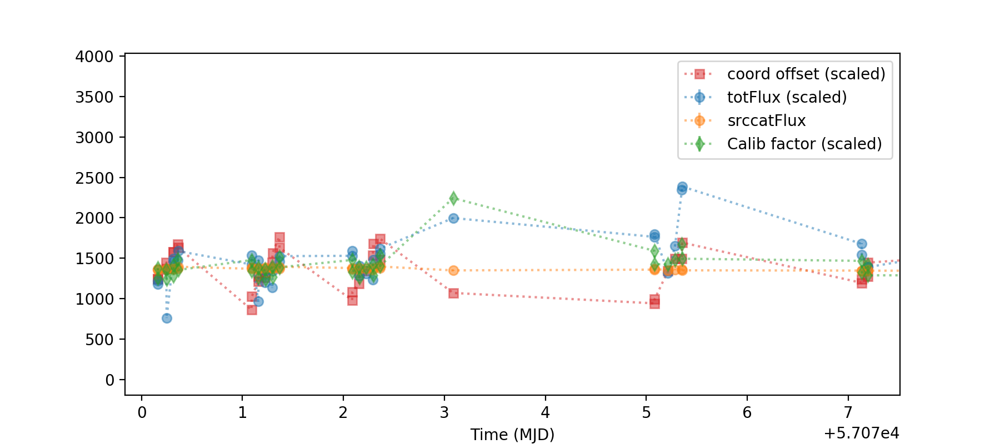

<IPython.core.display.Javascript object>


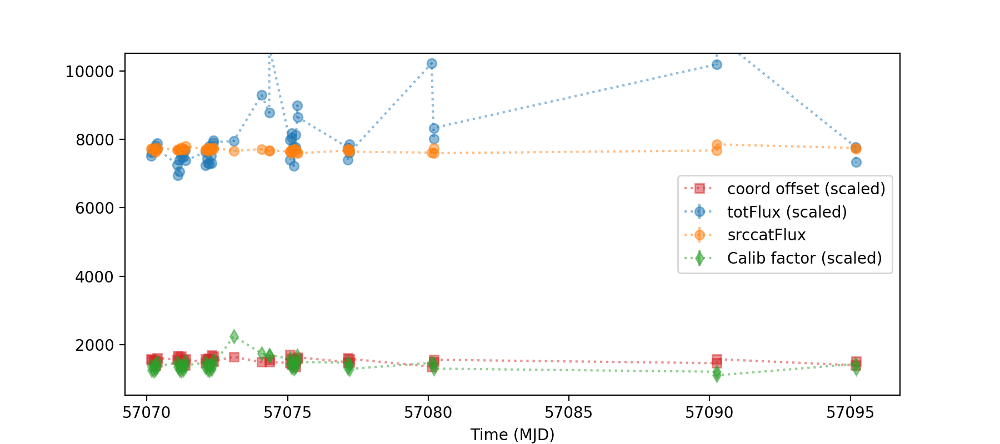

<IPython.core.display.Javascript object>


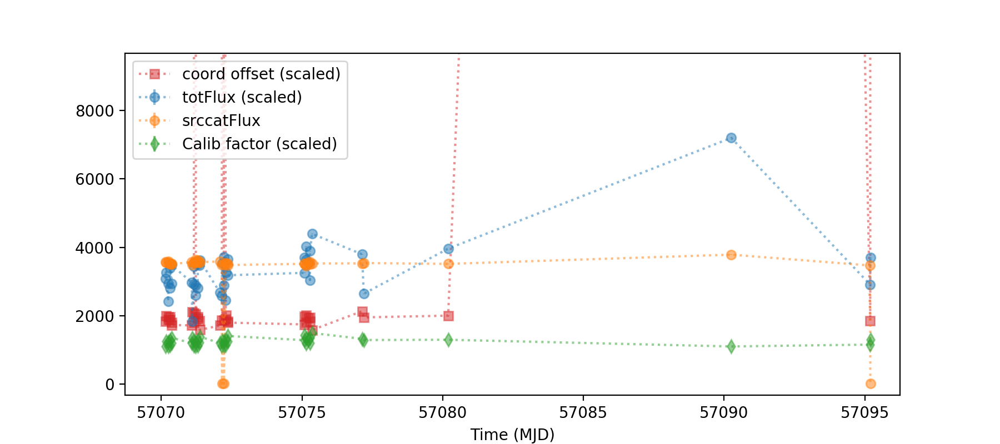

In [486]:
for objId in objTable.loc[objSubset, 'diaObjectId'].values:
    plotFluxCompare(repo, objId, objTable, fluxStrs = ['totFlux'])

----------
----------

## Miscellaneous other things vaguely related to this effort are below...

In [88]:
testVisitList = [int(str(visit)[0:6]) for visit in srcTable['ccdVisitId']]

<IPython.core.display.Javascript object>


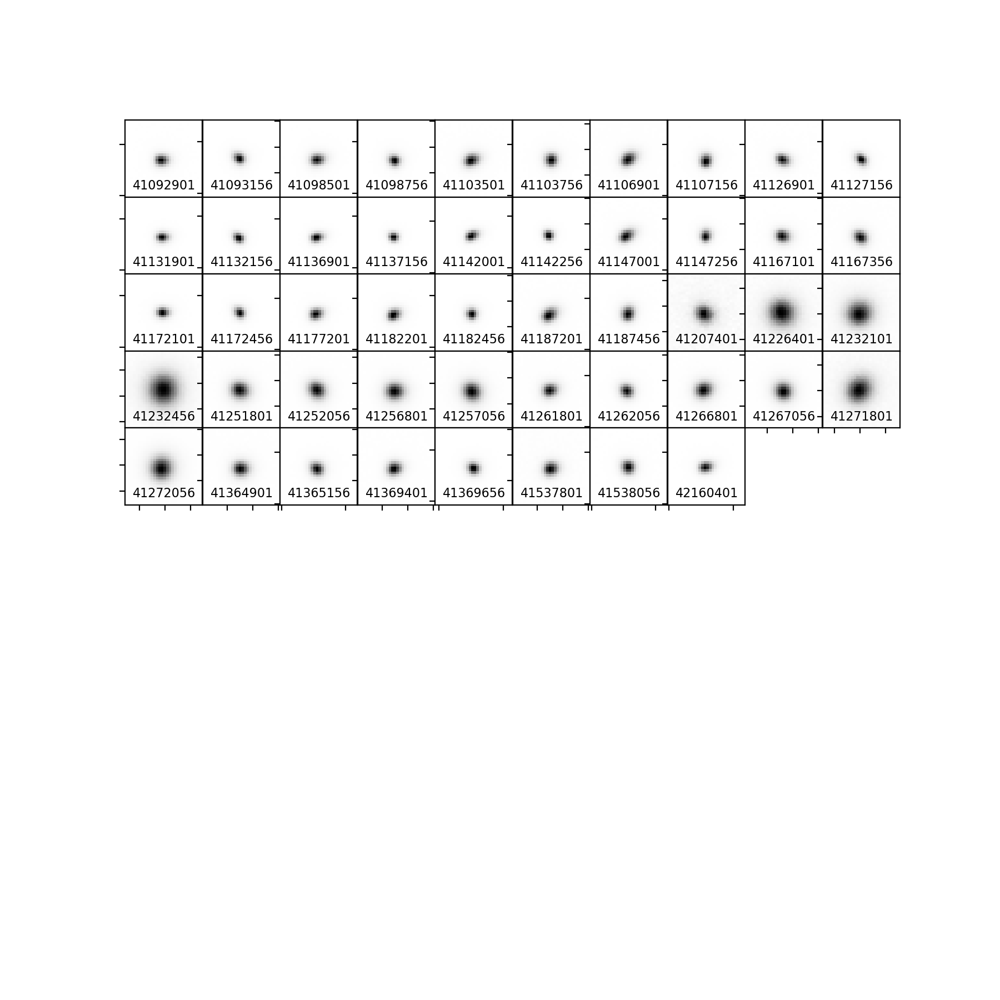

In [89]:
plotPsfs(butler, srcTable['ccdVisitId'], imageType='calexp')

In [90]:
#newObjId = 176492665892766016
newObjId = 176492665892766198
srcTableNew = loadSources(repo, newObjId)

Use the DIASource coordinates to make cutouts of the calexps

<IPython.core.display.Javascript object>


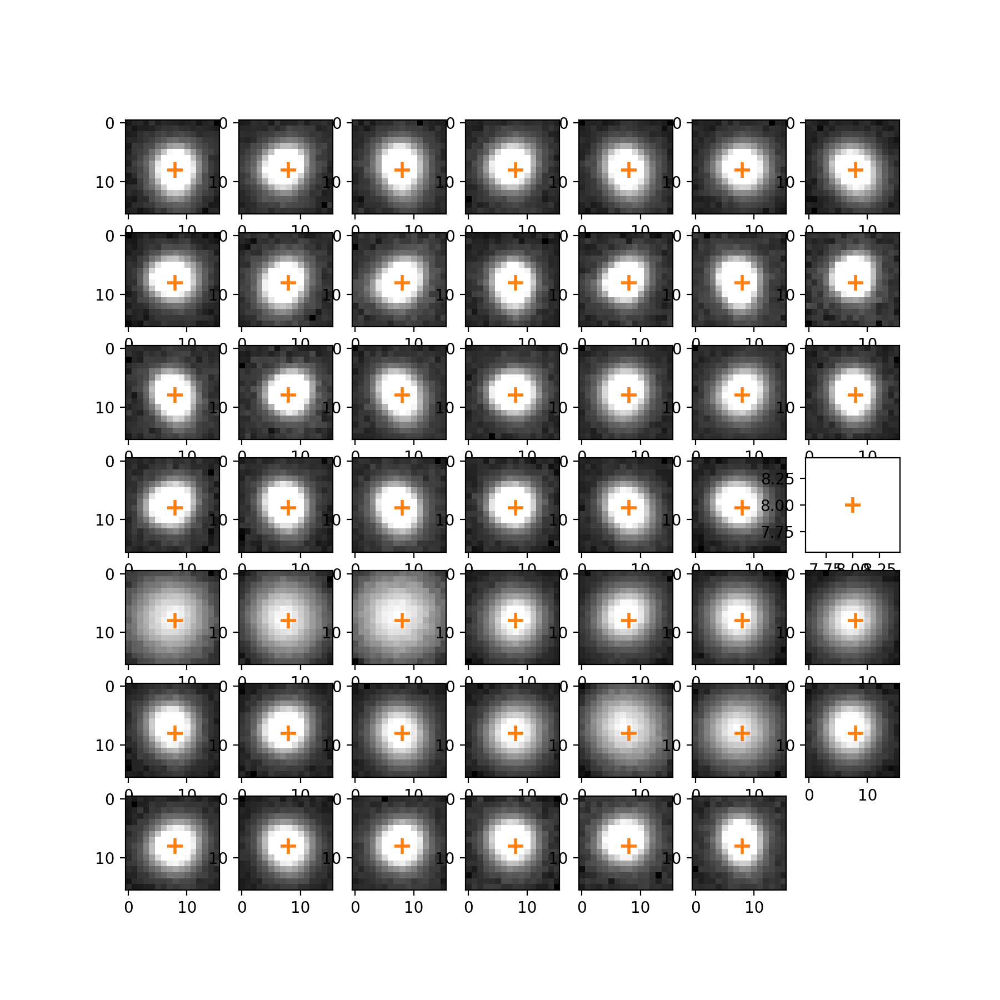

In [450]:
fig = plt.figure(figsize=(9,9))
raObj = objTable.loc[objTable['diaObjectId'] == newObjId, 'ra']
decObj = objTable.loc[objTable['diaObjectId'] == newObjId, 'decl']
skyCoordObj = coord.SkyCoord(raObj, decObj, unit=u.degree)
for idx, visit in enumerate(srcTableNew['ccdVisitId']):
    ax = fig.add_subplot(7, 7, idx+1)
    visit = str(visit)
    dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
    size = lsst.geom.Extent2I(16, 16)
    calsrc = butler.get('src', dataId=dataId)
    calsrc = calsrc.asAstropy()
    calsrcSkyCoord = coord.SkyCoord(calsrc['coord_ra'], calsrc['coord_dec'], unit=u.rad)
    matchIdx, matchAngle, match3d = skyCoordObj.match_to_catalog_sky(calsrcSkyCoord)
    ra = calsrc['coord_ra'][matchIdx][0]
    dec = calsrc['coord_dec'][matchIdx][0]
    plt.plot(8, 8, marker='+', ls='None', color='C1', ms=10, mew=2)
    #print(ra, dec)
    center = lsst.geom.SpherePoint(ra, dec, lsst.geom.radians)
    calexp = butler.get('calexp', dataId=dataId)
    try:
        calexpArray = calexp.getCutout(center, size).getMaskedImage().getImage().getArray()
    except:
        continue
    else:
        calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(np.rot90(np.fliplr(calexpArray)), cmap='gray', norm=calexpNorm)

Use the DIAObject coordinates (which is an average of the DIASource coordinates)

<IPython.core.display.Javascript object>


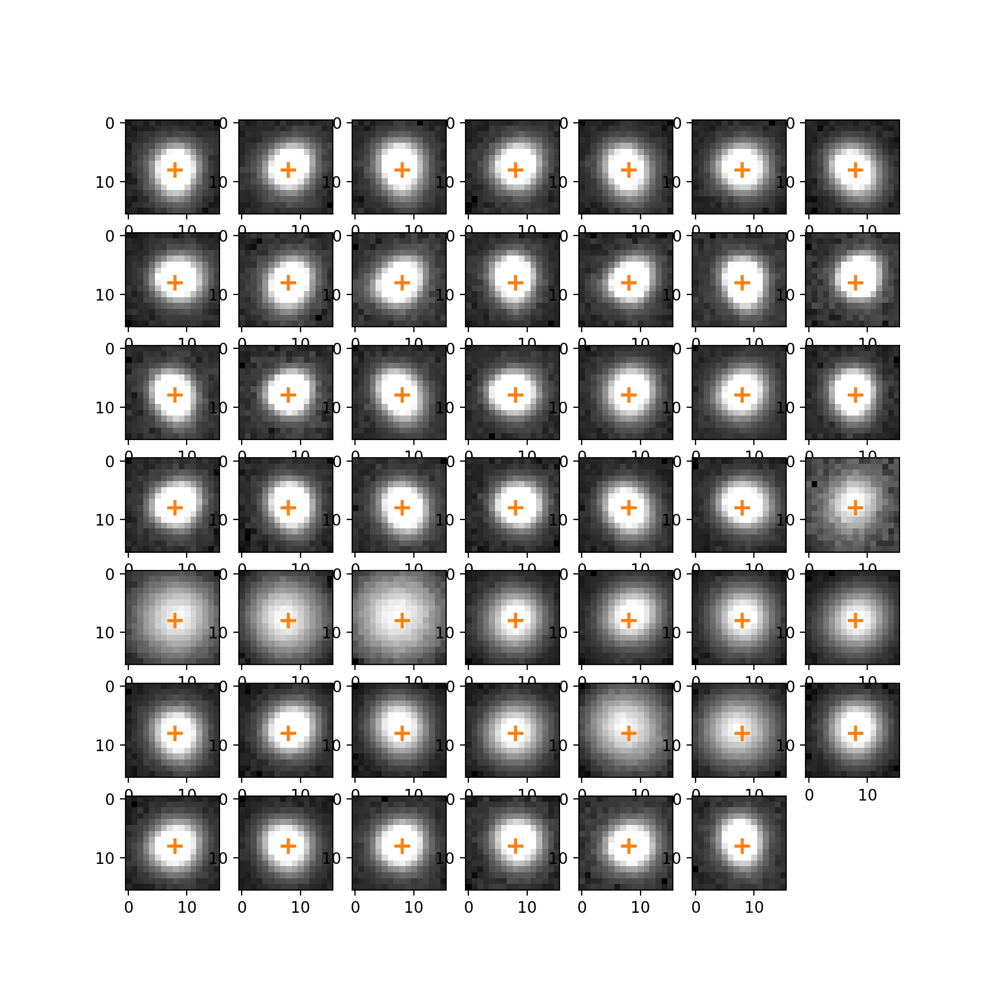

In [449]:
fig = plt.figure(figsize=(9,9))
raObj = objTable.loc[objTable['diaObjectId'] == newObjId, 'ra']
decObj = objTable.loc[objTable['diaObjectId'] == newObjId, 'decl']
skyCoordObj = coord.SkyCoord(raObj, decObj, unit=u.degree)
for idx, visit in enumerate(srcTableNew['ccdVisitId']):
    ax = fig.add_subplot(7, 7, idx+1)
    visit = str(visit)
    dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
    size = lsst.geom.Extent2I(16, 16)
    calsrc = butler.get('src', dataId=dataId)
    calsrc = calsrc.asAstropy()
    calsrcSkyCoord = coord.SkyCoord(calsrc['coord_ra'], calsrc['coord_dec'], unit=u.rad)
    matchIdx, matchAngle, match3d = skyCoordObj.match_to_catalog_sky(calsrcSkyCoord)
    #ra = calsrc['coord_ra'][matchIdx][0]
    #dec = calsrc['coord_dec'][matchIdx][0]
    center = lsst.geom.SpherePoint(raObj, decObj, lsst.geom.degrees)
    plt.plot(8, 8, marker='+', ls='None', color='C1', ms=10, mew=2)
    calexp = butler.get('calexp', dataId=dataId)
    try:
        calexpArray = calexp.getCutout(center, size).getMaskedImage().getImage().getArray()
    except:
        continue
    else:
        calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
        plt.imshow(np.rot90(np.fliplr(calexpArray)), cmap='gray', norm=calexpNorm)

... this is not a precise enough way to plot centroids on top of sources, because I'm using imshow with a pixellated zoom level and matplotlib doesn't have a WCS and just nevermind

Below is modified pipe_analysis-based plotting tools for exploring the template patches

In [11]:
# Modified pipe_analysis-based plotting stuff

def percent(values, p=0.5):
    """Return a value a faction of the way between the min and max values in a list."""
    m = min(values)
    interval = max(values) - m
    return m + p*interval

def bboxToRaDec(bbox, wcs):
    """Get the corners of a BBox and convert them to lists of RA and Dec."""
    corners = []
    for corner in bbox.getCorners():
        p = lsst.geom.Point2D(corner.getX(), corner.getY())
        coord = wcs.pixelToSky(p)
        corners.append([coord.getRa().asDegrees(), coord.getDec().asDegrees()])
    ra, dec = zip(*corners)
    return ra, dec

def getRaDecMinMaxPatchList(patchList, tractInfo, pad=0.0, nDecimals=4, raMin=360.0, raMax=0.0, decMin=90.0, decMax=-90.0):
    for ip, patch in enumerate(tractInfo):
        if str(patch.getIndex()[0])+","+str(patch.getIndex()[1]) in patchList:
            raPatch, decPatch = bboxToRaDec(patch.getOuterBBox(), tractInfo.getWcs())
            raMin = min(np.round(min(raPatch) - pad, nDecimals), raMin)
            raMax = max(np.round(max(raPatch) + pad, nDecimals), raMax)
            decMin = min(np.round(min(decPatch) - pad, nDecimals), decMin)
            decMax = max(np.round(max(decPatch) + pad, nDecimals), decMax)
    return Struct(
        raMin = raMin,
        raMax = raMax,
        decMin = decMin,
        decMax = decMax,
    )

def plotTractOutline(axes, tractInfo, patchList, fontSize=5, maxDegBeyondPatch=1.5):
    buff = 0.02
    axes.tick_params(which="both", direction="in", labelsize=fontSize)
    axes.locator_params(nbins=6)
    axes.ticklabel_format(useOffset=False)

    tractRa, tractDec = bboxToRaDec(tractInfo.getBBox(), tractInfo.getWcs())
    patchBoundary = getRaDecMinMaxPatchList(patchList, tractInfo, pad=maxDegBeyondPatch)

    xMin = min(max(tractRa), patchBoundary.raMax) + buff
    xMax = max(min(tractRa), patchBoundary.raMin) - buff
    yMin = max(min(tractDec), patchBoundary.decMin) - buff
    yMax = min(max(tractDec), patchBoundary.decMax) + buff
    xlim = xMin, xMax
    ylim = yMin, yMax
    axes.fill(tractRa, tractDec, fill=True, edgecolor='k', lw=1, linestyle='solid',
              color="black", alpha=0.2)
    for ip, patch in enumerate(tractInfo):
        patchIndexStr = str(patch.getIndex()[0]) + "," + str(patch.getIndex()[1])
        color = "k"
        alpha = 0.05
        if patchIndexStr in patchList:
            color='C0'
            alpha = 0.5
        ra, dec = bboxToRaDec(patch.getOuterBBox(), tractInfo.getWcs())
        deltaRa = abs(max(ra) - min(ra))
        deltaDec = abs(max(dec) - min(dec))
        pBuff = 0.5*max(deltaRa, deltaDec)
        centerRa = min(ra) + 0.5*deltaRa
        centerDec = min(dec) + 0.5*deltaDec
        if (centerRa < xMin + pBuff and centerRa > xMax - pBuff and
                centerDec > yMin - pBuff and centerDec < yMax + pBuff):
            axes.fill(ra, dec, fill=True, color=color, lw=1, linestyle="solid", alpha=alpha)
            if patchIndexStr in patchList or (centerRa < xMin - 0.2*pBuff and
                                              centerRa > xMax + 0.2*pBuff and
                                              centerDec > yMin + 0.2*pBuff and
                                              centerDec < yMax - 0.2*pBuff):
                axes.text(percent(ra), percent(dec, 0.5), str(patchIndexStr),
                          fontsize=fontSize - 1, horizontalalignment="center", verticalalignment="center")
    axes.set_xlabel('RA', size='large')
    axes.set_ylabel('Dec', size='large')
    axes.set_xlim(xlim)
    axes.set_ylim(ylim)

In [17]:
dataIdSkymap = {'filter': 'g', 'tract': 0, 'patch': '0,0'}  # placeholder
skymap = templateButler.get('deepCoadd_skyMap', dataId=dataIdSkymap)
for tractInfo in skymap:
    everyPatchList = [str(patch.getIndex()[0]) + ',' + str(patch.getIndex()[1]) for patch in tractInfo]
    dataPatchList = []
    for patch in everyPatchList:
        try:
            dataIdPatch = {'filter': 'g', 'tract': 0, 'patch': patch}
            coadd_test = templateButler.get('deepCoadd', dataId=dataIdPatch)
        except:
            #print('No data in this patch', patch)
            continue
        else:
            #print('This patch has a coadd', patch)
            dataPatchList.append(patch)

<IPython.core.display.Javascript object>


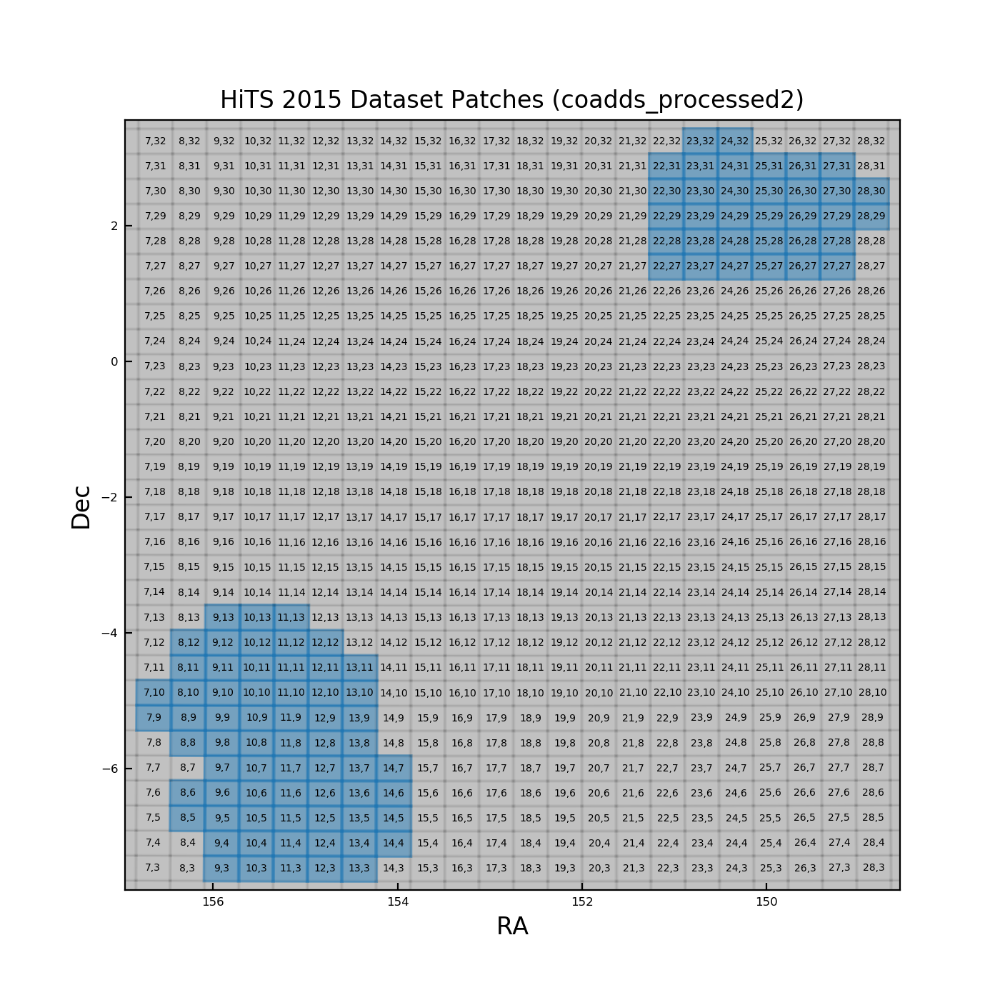

Text(0.5, 1.0, 'HiTS 2015 Dataset Patches (coadds_processed2)')

In [401]:
fig = plt.figure(figsize=(7,7))
axes = fig.gca()
plotTractOutline(axes, tractInfo=skymap[0], patchList=dataPatchList, fontSize=6, maxDegBeyondPatch=0.1)
plt.title('HiTS 2015 Dataset Patches (coadds_processed2)')